Rainfall Weather Forecasting
Project Description
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:
Number of columns: 23


Date  - The date of observation
Location  -The common name of the location of the weather station
MinTemp  -The minimum temperature in degrees celsius
MaxTemp -The maximum temperature in degrees celsius
Rainfall  -The amount of rainfall recorded for the day in mm
Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
Sunshine  -The number of hours of bright sunshine in the day.
WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight
WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
WindDir9am -Direction of the wind at 9am
WindDir3pm -Direction of the wind at 3pm
WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am
WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
Humidity9am -Humidity (percent) at 9am
Humidity3pm -Humidity (percent) at 3pm
Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am
Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm
Cloud9am - Fraction of sky obscured by cloud at 9am. 
Cloud3pm -Fraction of sky obscured by cloud 
Temp9am-Temperature (degrees C) at 9am
Temp3pm -Temperature (degrees C) at 3pm
RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

Dataset Link-  
•	https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv
•	https://github.com/dsrscientist/dataset3


Importing of Libraries

# Power project as Regression problem

In [1]:
import pandas as pd
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn import tree
from sklearn.preprocessing import power_transform
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics  import roc_auc_score
import warnings
warnings.filterwarnings('ignore')
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import ExtraTreesClassifier
from scipy.stats.mstats import normaltest
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.metrics import accuracy_score,roc_curve, roc_auc_score
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import roc_curve
from sklearn.metrics  import roc_auc_score
from sklearn.metrics import r2_score
from scipy.stats.mstats import normaltest
import warnings
warnings.filterwarnings('ignore')

ERROR! Session/line number was not unique in database. History logging moved to new session 909


Extracting the Data

In [2]:
Rain=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv')
Rain


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


We can see that their are NaN value Present in the dataset which is needed to be corrected or filled accordingly..In Rain Tomorrow columns we find 2 classes present Yes And No which makes it a Logistic Regression problem and NaN values are also present in this columns
In Rain Tomorrow columns we find 2 classes present Yes And No which makes it a Logistic Regression problem

In [3]:
Rain.shape

(8425, 23)

 we can see that  we have 8425 rows and  23 columns ie attributes and when we check the shape its showing 23 which mean one column is target and it is 'capacity_mw'

In [4]:
Rain.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [5]:
Rain.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

All the above 23 columns have  Null and non null  values and out of 23 attributes or input columns we have only 1 columns as output and and rest all are 23 columns are int -00,object-07 and Float=16. and object has to be changed using Ordinal encoder
So we have 16 Numeric datatypes and 7 Object type data types and Rain Tommorrow is in object type which makes it Logistic Regression and Classification problem
Here we get the Information regarding Column,Non-Null Count(columns having NaN Values) ,Dtypes and Memory usage of the dataset ..Here we notice one thing that Non Null columns counts are different which indicates that Null values are present in the dataset and needed to be rectified

In [6]:
Rain.columns = Rain.columns.str.replace(' ', '_')
Rain.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [7]:
Rain.isnull().sum()     #no Missing Values

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

Here we can see that lot of NaN values are present in the dataset which is needed to be filled accordingly

In [8]:
Rain

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [9]:
Rain.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

We can see that lot of Unique values are present in the dataset and inside Rain Tommorrow 2 variables are present as Yes and No

Correct data column in datetime format

In [10]:
# Changing date column from object type to Date Type
Rain['Date']=pd.to_datetime(Rain['Date'])

In [11]:
Rain['Month']=Rain['Date'].apply(lambda x:x.month)
Rain['Day']=Rain['Date'].apply(lambda x:x.day)

In [12]:
Rain.duplicated().sum()

1663

In [13]:
Rain.drop_duplicates(inplace=True)

In [14]:
#dropping duplicate rows and resetting index
Rain=Rain.drop_duplicates()
print('Number of rows after removing duplicates=', len(Rain))

Number of rows after removing duplicates= 6762


In [15]:
#Rain.drop(['MaxTemp','Pressure9am','Pressure3pm','Temp9am','Temp3pm','Sunshine'],axis=1,inplace=True)

In [16]:
# Now Lets Drop Date columns from the dataset bcz we have already made the columns for Month and day in the dateset above 
# Year columns was already pre mentioned in the dateset
#dropping the columns with very high multicollinearity
Rain.drop(['Date'],axis=1,inplace=True)
Rain

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,12,1
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,12,2
2,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,...,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,12,3
3,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,...,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,12,4
4,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,...,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,...,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No,6,21
8421,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,...,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No,6,22
8422,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,...,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No,6,23
8423,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,...,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,6,24


In [17]:
#Replacing NaN values in numerical columns
Rain['MinTemp'] = Rain['MinTemp'].fillna(Rain['MinTemp'].median())
Rain["MaxTemp"] = Rain["MaxTemp"].fillna(Rain["MaxTemp"].median())
Rain['WindGustDir'] = Rain['WindGustDir'].fillna(Rain['WindGustDir'].mode()[0])
Rain["WindGustSpeed"] = Rain["WindGustSpeed"].fillna(Rain["WindGustSpeed"].median())
Rain['WindDir9am'] = Rain['WindDir9am'].fillna(Rain['WindDir9am'].mode()[0])
Rain['WindDir3pm'] = Rain['WindDir3pm'].fillna(Rain['WindDir3pm'].mode()[0])
Rain['WindSpeed9am'] = Rain['WindSpeed9am'].fillna(Rain['WindSpeed9am'].median())
Rain['WindSpeed3pm'] = Rain['WindSpeed3pm'].fillna(Rain['WindSpeed3pm'].median())
Rain["MaxTemp"] = Rain["MaxTemp"].fillna(Rain["MaxTemp"].median())
Rain['Humidity9am'] = Rain['Humidity9am'].fillna(Rain['Humidity9am'].median())
Rain["Humidity3pm"] = Rain["Humidity3pm"].fillna(Rain["Humidity3pm"].median())
Rain["Rainfall"] = Rain["Rainfall"].fillna(Rain["Rainfall"].mode()[0])
Rain["Evaporation"] = Rain["Evaporation"].fillna(Rain["Evaporation"].median())
Rain["Sunshine"] = Rain["Sunshine"].fillna(Rain["Sunshine"].median())
Rain["Pressure9am"] = Rain["Pressure9am"].fillna(Rain["Pressure9am"].median())
Rain["Pressure3pm"] = Rain["Pressure3pm"].fillna(Rain["Pressure3pm"].median())
Rain["Cloud9am"] = Rain["Cloud9am"].fillna(Rain["Cloud9am"].median())
Rain["Cloud3pm"] = Rain["Cloud3pm"].fillna(Rain["Cloud3pm"].median())
Rain["Temp9am"] = Rain["Temp9am"].fillna(Rain["Temp9am"].median())
Rain["Temp3pm"] = Rain["Temp3pm"].fillna(Rain["Temp3pm"].median())
Rain["RainToday"] = Rain["RainToday"].fillna(Rain["RainToday"].mode()[0])
Rain["RainTomorrow"] = Rain["RainTomorrow"].fillna(Rain["RainTomorrow"].mode()[0])



#filling nan Values in latitude', 'longitude', 'geolocation_source',, 'generation_gwh_2014', 'generation_gwh_2015',generation_gwh_2016', 'generation_gwh_2017', 'generation_gwh_2018',

<AxesSubplot:>

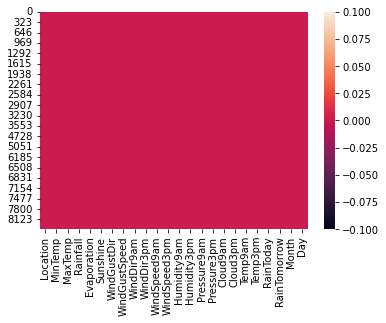

In [18]:
sns.heatmap(Rain.isnull())

In [19]:
Rain.duplicated().sum()# No Duplicate Values

0

In [20]:
Rain.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Month            0
Day              0
dtype: int64

In [21]:
Rain

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,Albury,13.4,22.9,0.6,4.6,9.0,W,44.0,W,WNW,...,1007.7,1007.1,8.0,5.0,16.9,21.8,No,No,12,1
1,Albury,7.4,25.1,0.0,4.6,9.0,WNW,44.0,NNW,WSW,...,1010.6,1007.8,5.0,5.0,17.2,24.3,No,No,12,2
2,Albury,12.9,25.7,0.0,4.6,9.0,WSW,46.0,W,WSW,...,1007.6,1008.7,5.0,2.0,21.0,23.2,No,No,12,3
3,Albury,9.2,28.0,0.0,4.6,9.0,NE,24.0,SE,E,...,1017.6,1012.8,5.0,5.0,18.1,26.5,No,No,12,4
4,Albury,17.5,32.3,1.0,4.6,9.0,W,41.0,ENE,NW,...,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.4,0.0,4.6,9.0,E,31.0,SE,ENE,...,1024.6,1020.3,5.0,5.0,10.1,22.4,No,No,6,21
8421,Uluru,3.6,25.3,0.0,4.6,9.0,NNW,22.0,SE,N,...,1023.5,1019.1,5.0,5.0,10.9,24.5,No,No,6,22
8422,Uluru,5.4,26.9,0.0,4.6,9.0,N,37.0,SE,WNW,...,1021.0,1016.8,5.0,5.0,12.5,26.1,No,No,6,23
8423,Uluru,7.8,27.0,0.0,4.6,9.0,SE,28.0,SSE,N,...,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No,6,24


In [22]:
Rain.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Month            0
Day              0
dtype: int64

Finally no null values are present

In [23]:
#Frequency of 'capacity_mw'
Rain['RainTomorrow'].value_counts()

No     5190
Yes    1572
Name: RainTomorrow, dtype: int64

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

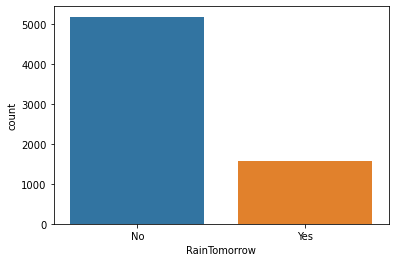

In [24]:
# Plotting the 'capacity_mw' frequency
sns.countplot(data=Rain,x='RainTomorrow')

In [25]:
#Normalizing the frequency table of 'AveragePrice' variable
Rain['RainTomorrow'].value_counts(normalize=True)

No     0.767524
Yes    0.232476
Name: RainTomorrow, dtype: float64

In [26]:
#Frequency table
Rain['RainTomorrow'].value_counts()

No     5190
Yes    1572
Name: RainTomorrow, dtype: int64

# EDA

Encoding Techniques

In [27]:
from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()
for i in Rain.columns:
    if Rain[i].dtypes=='object':
        Rain[i]=enc.fit_transform(Rain[i].values.reshape(-1,1))
Rain

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,1.0,13.4,22.9,0.6,4.6,9.0,13.0,44.0,13.0,14.0,...,1007.7,1007.1,8.0,5.0,16.9,21.8,0.0,0.0,12,1
1,1.0,7.4,25.1,0.0,4.6,9.0,14.0,44.0,6.0,15.0,...,1010.6,1007.8,5.0,5.0,17.2,24.3,0.0,0.0,12,2
2,1.0,12.9,25.7,0.0,4.6,9.0,15.0,46.0,13.0,15.0,...,1007.6,1008.7,5.0,2.0,21.0,23.2,0.0,0.0,12,3
3,1.0,9.2,28.0,0.0,4.6,9.0,4.0,24.0,9.0,0.0,...,1017.6,1012.8,5.0,5.0,18.1,26.5,0.0,0.0,12,4
4,1.0,17.5,32.3,1.0,4.6,9.0,13.0,41.0,1.0,7.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.0,4.6,9.0,0.0,31.0,9.0,1.0,...,1024.6,1020.3,5.0,5.0,10.1,22.4,0.0,0.0,6,21
8421,9.0,3.6,25.3,0.0,4.6,9.0,6.0,22.0,9.0,3.0,...,1023.5,1019.1,5.0,5.0,10.9,24.5,0.0,0.0,6,22
8422,9.0,5.4,26.9,0.0,4.6,9.0,3.0,37.0,9.0,14.0,...,1021.0,1016.8,5.0,5.0,12.5,26.1,0.0,0.0,6,23
8423,9.0,7.8,27.0,0.0,4.6,9.0,9.0,28.0,10.0,3.0,...,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,0.0,6,24


by using encoding techniques we have converted into float  from Object  

In [28]:
Rain.dtypes

Location         float64
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir      float64
WindGustSpeed    float64
WindDir9am       float64
WindDir3pm       float64
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday        float64
RainTomorrow     float64
Month              int64
Day                int64
dtype: object

So here we can see that our 'capacity_mw ' is in float format ,and by this we can make the decision that we have to build a Regression Model. . 

Visualization using Count and Bar Plot for Input and output Variables

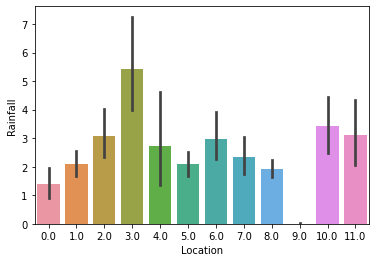

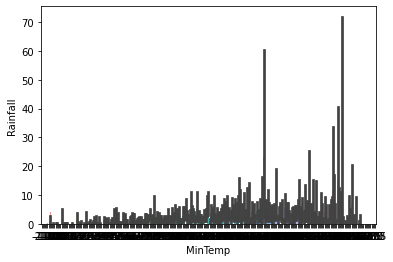

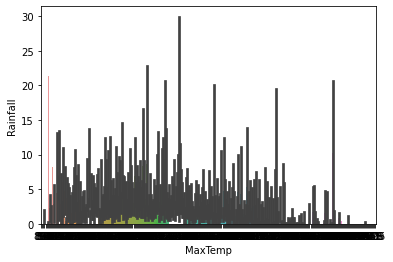

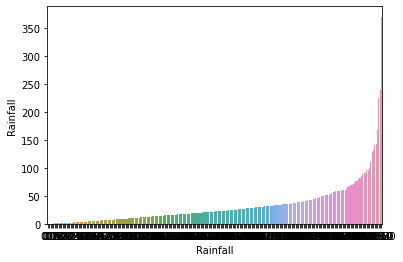

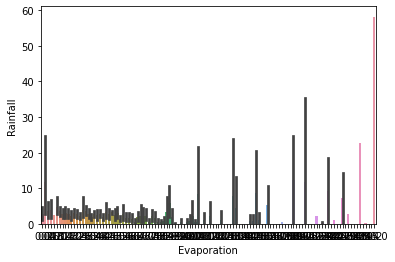

...

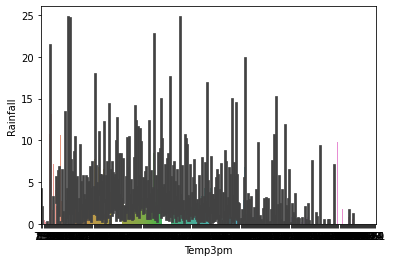

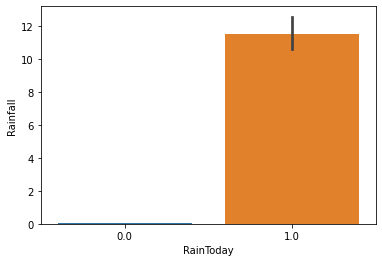

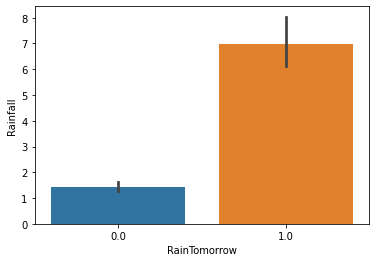

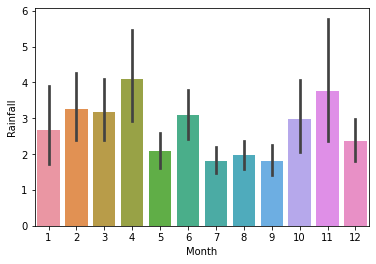

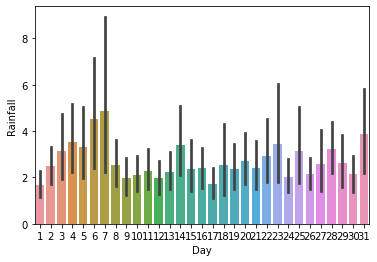

In [29]:
for column in Rain.columns:
    sns.barplot(x=column,y='Rainfall',data=Rain)
    plt.xlabel(column)
    plt.show()


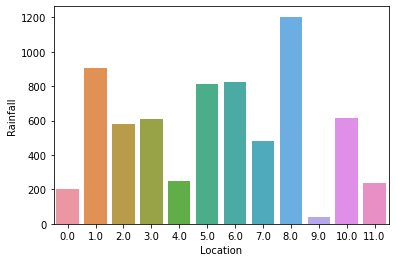

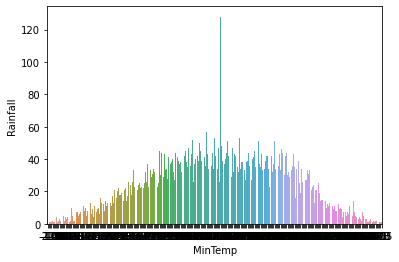

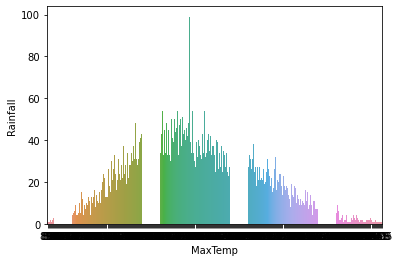

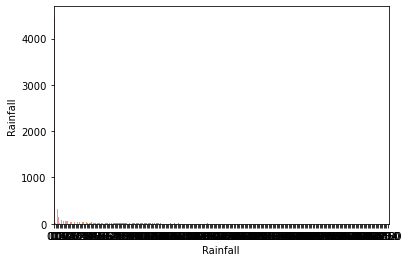

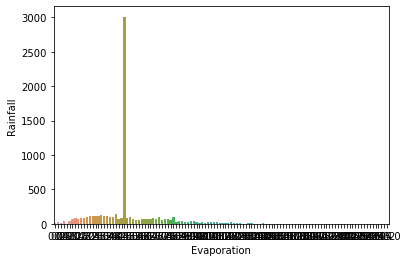

...

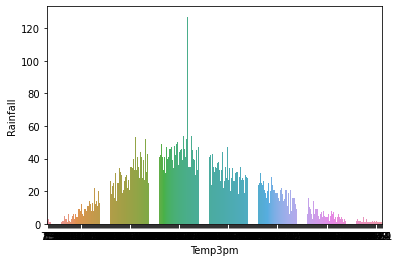

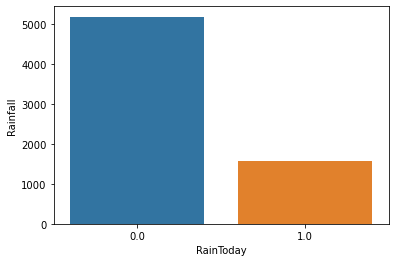

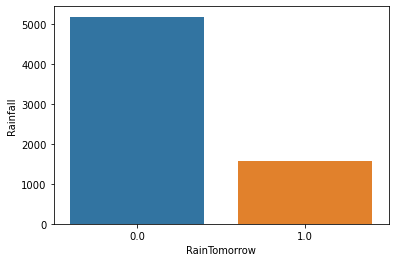

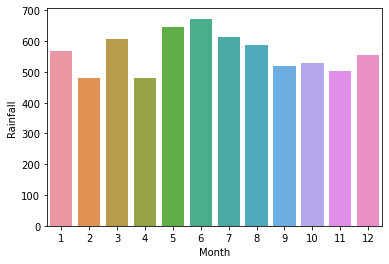

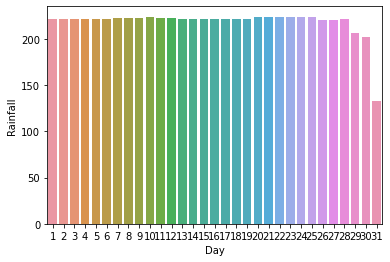

In [30]:
for column in Rain.columns:
    sns.countplot(x=column, data=Rain)
    plt.xlabel(column)
    plt.ylabel('Rainfall')
    plt.show()

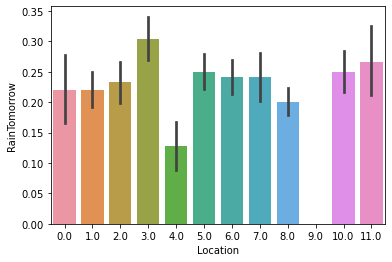

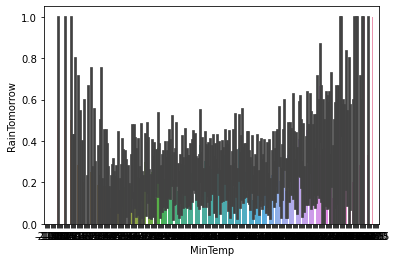

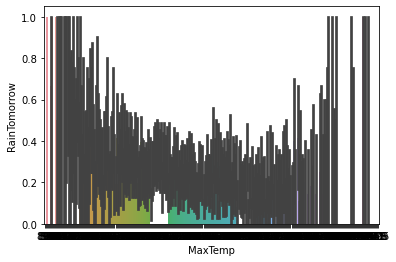

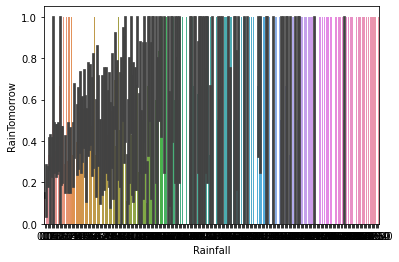

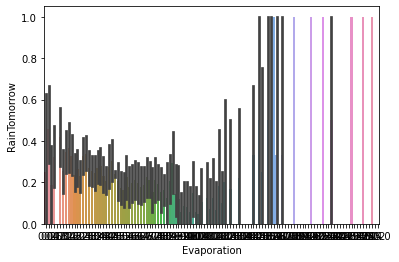

...

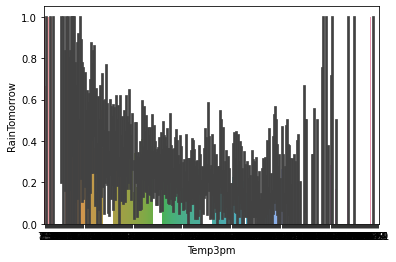

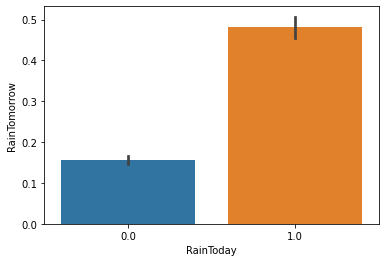

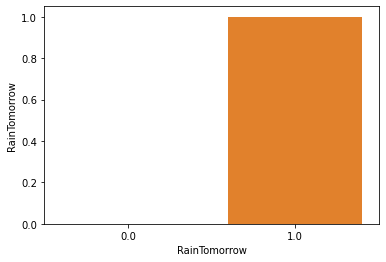

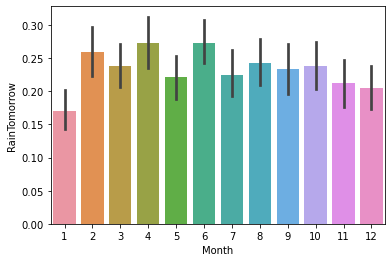

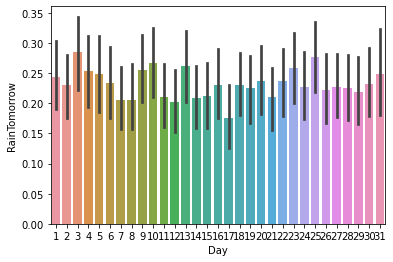

In [31]:
for column in Rain.columns:
    sns.barplot(x=column,y='RainTomorrow',data=Rain)
    plt.xlabel(column)
    plt.show()


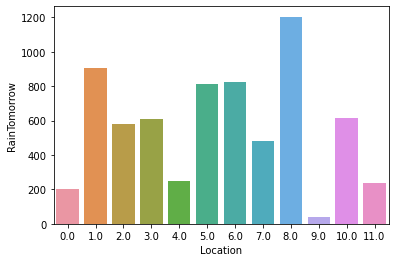

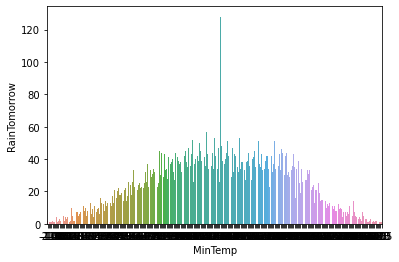

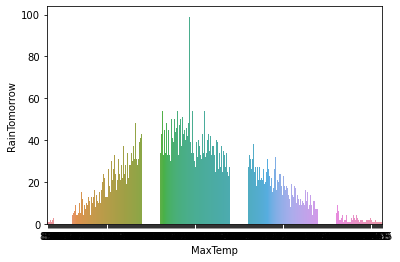

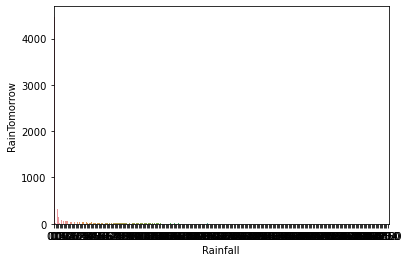

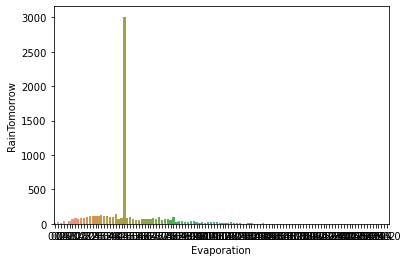

...

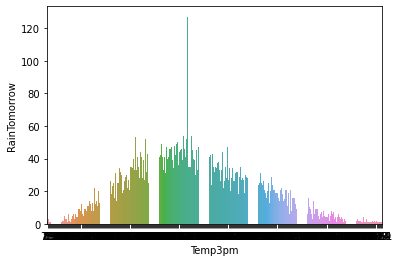

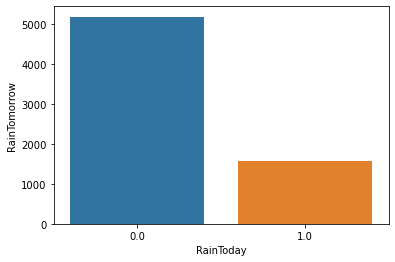

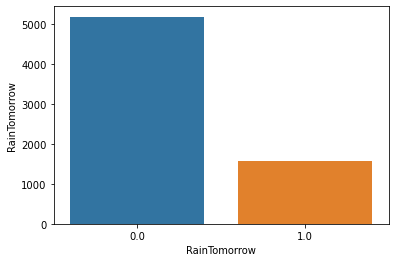

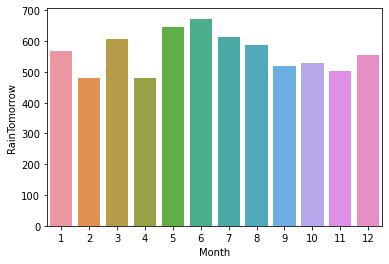

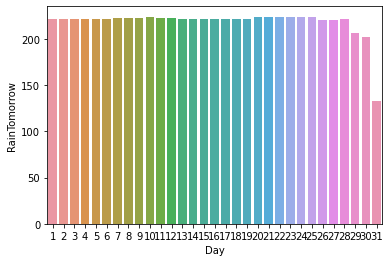

In [32]:
for column in Rain.columns:
    sns.countplot(x=column, data=Rain)
    plt.xlabel(column)
    plt.ylabel('RainTomorrow')
    plt.show()

Histogram View 

array([[<AxesSubplot:title={'center':'Location'}>,
        <AxesSubplot:title={'center':'MinTemp'}>,
        <AxesSubplot:title={'center':'MaxTemp'}>,
        <AxesSubplot:title={'center':'Rainfall'}>,
        <AxesSubplot:title={'center':'Evaporation'}>],
       [<AxesSubplot:title={'center':'Sunshine'}>,
        <AxesSubplot:title={'center':'WindGustDir'}>,
        <AxesSubplot:title={'center':'WindGustSpeed'}>,
        <AxesSubplot:title={'center':'WindDir9am'}>,
        <AxesSubplot:title={'center':'WindDir3pm'}>],
       [<AxesSubplot:title={'center':'WindSpeed9am'}>,
        <AxesSubplot:title={'center':'WindSpeed3pm'}>,
        <AxesSubplot:title={'center':'Humidity9am'}>,
        <AxesSubplot:title={'center':'Humidity3pm'}>,
        <AxesSubplot:title={'center':'Pressure9am'}>],
       [<AxesSubplot:title={'center':'Pressure3pm'}>,
        <AxesSubplot:title={'center':'Cloud9am'}>,
        <AxesSubplot:title={'center':'Cloud3pm'}>,
        <AxesSubplot:title={'center':'Temp9am'

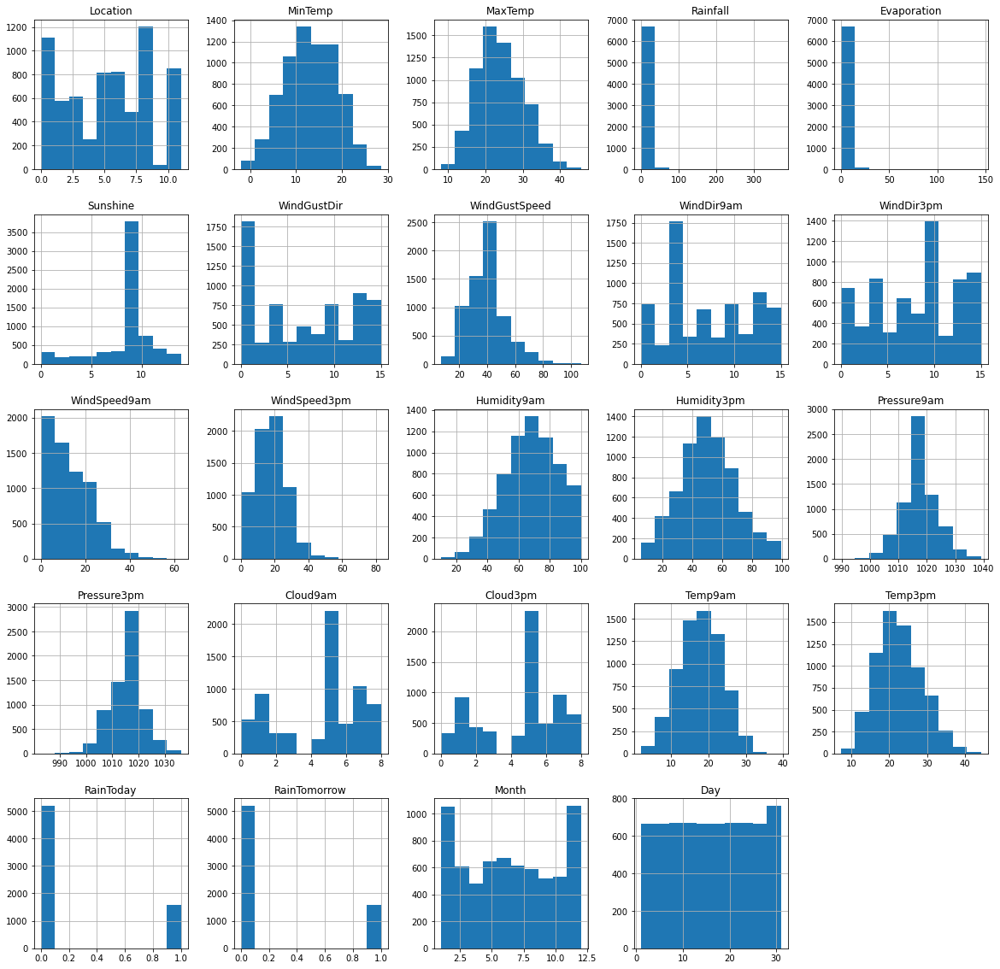

In [33]:
Rain.hist(bins=10, figsize=(20,20))

We can notice that lot of Skewness is present in the dataset(Right and Left both skewness is present) ,So we will reduce all this skewness later. Only latitude seem to have Normal Distribution..

# Bivarate


In [34]:
Rain.columns

Index(['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow', 'Month', 'Day'],
      dtype='object')

<AxesSubplot:xlabel='Location', ylabel='Rainfall'>

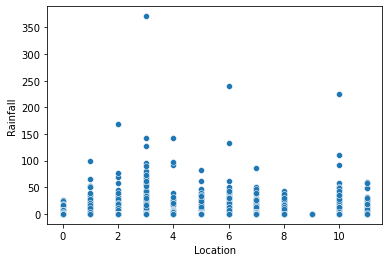

In [35]:
sns.scatterplot(x='Location',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Evaporation', ylabel='Rainfall'>

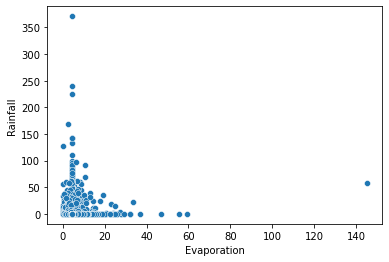

In [36]:
sns.scatterplot(x='Evaporation',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Sunshine', ylabel='Rainfall'>

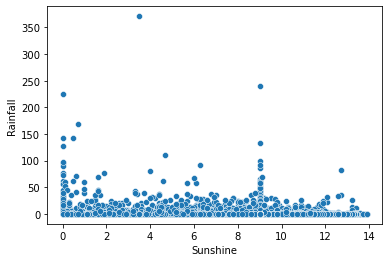

In [37]:
sns.scatterplot(x='Sunshine',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Rainfall'>

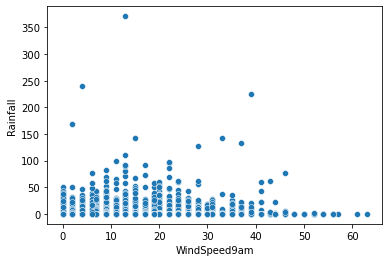

In [38]:
sns.scatterplot(x='WindSpeed9am',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Rainfall'>

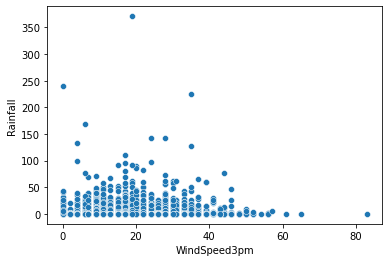

In [39]:
sns.scatterplot(x='WindSpeed3pm',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Evaporation', ylabel='Rainfall'>

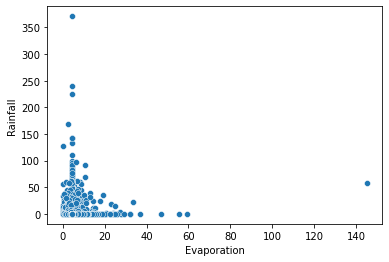

In [40]:
sns.scatterplot(x='Evaporation',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Humidity9am', ylabel='Rainfall'>

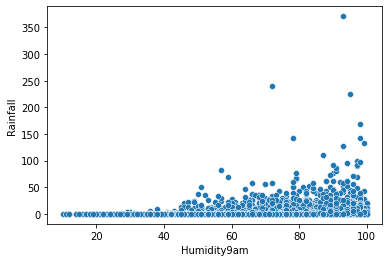

In [41]:
sns.scatterplot(x='Humidity9am',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Humidity3pm', ylabel='Rainfall'>

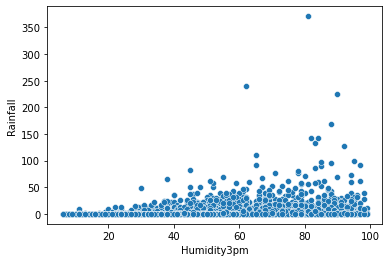

In [42]:
sns.scatterplot(x='Humidity3pm',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Humidity3pm', ylabel='RainTomorrow'>

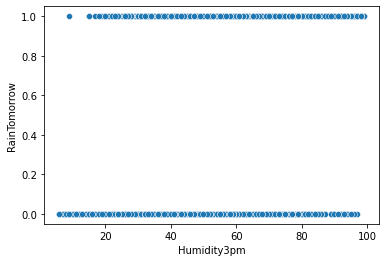

In [43]:
sns.scatterplot(x='Humidity3pm',y='RainTomorrow',data=Rain)

<AxesSubplot:xlabel='Pressure9am', ylabel='Rainfall'>

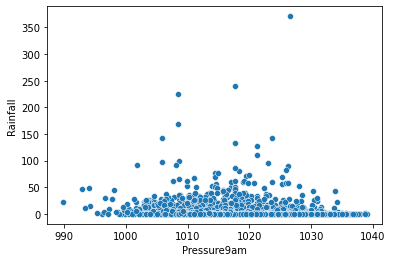

In [44]:
sns.scatterplot(x='Pressure9am',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Pressure3pm', ylabel='Rainfall'>

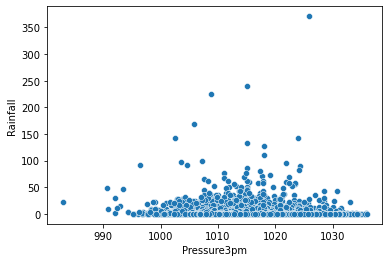

In [45]:
sns.scatterplot(x='Pressure3pm',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Humidity3pm', ylabel='RainTomorrow'>

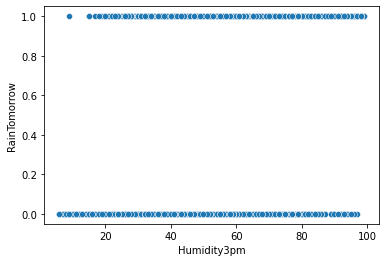

In [46]:
sns.scatterplot(x='Humidity3pm',y='RainTomorrow',data=Rain)

<AxesSubplot:xlabel='Cloud9am', ylabel='RainTomorrow'>

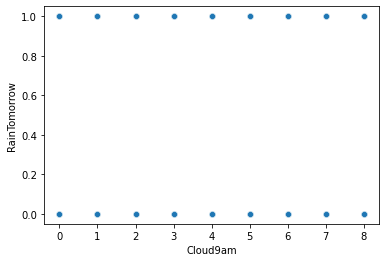

In [47]:
sns.scatterplot(x='Cloud9am',y='RainTomorrow',data=Rain)

<AxesSubplot:xlabel='Cloud3pm', ylabel='Rainfall'>

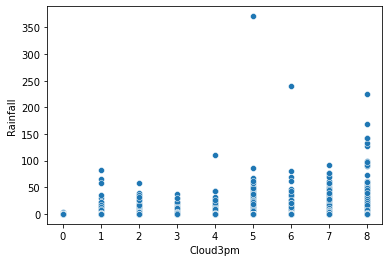

In [48]:
sns.scatterplot(x='Cloud3pm',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Cloud3pm', ylabel='RainTomorrow'>

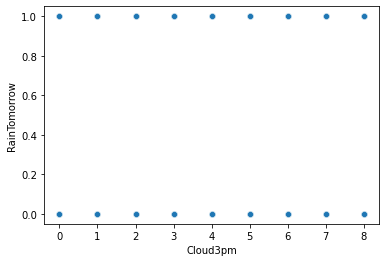

In [49]:
sns.scatterplot(x='Cloud3pm',y='RainTomorrow',data=Rain)

<AxesSubplot:xlabel='Temp9am', ylabel='Rainfall'>

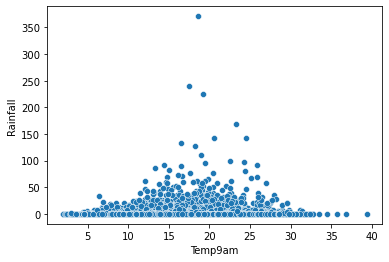

In [50]:
sns.scatterplot(x='Temp9am',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Temp3pm', ylabel='Rainfall'>

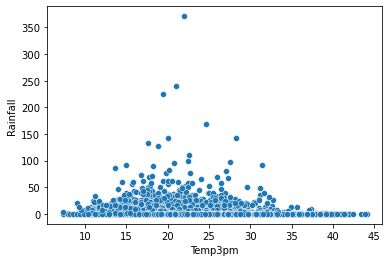

In [51]:
sns.scatterplot(x='Temp3pm',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='Cloud3pm', ylabel='Rainfall'>

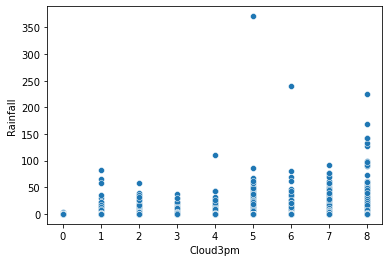

In [52]:
sns.scatterplot(x='Cloud3pm',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='RainToday', ylabel='Rainfall'>

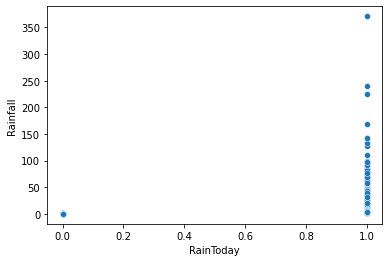

In [53]:
sns.scatterplot(x='RainToday',y='Rainfall',data=Rain)

<AxesSubplot:xlabel='RainTomorrow', ylabel='Rainfall'>

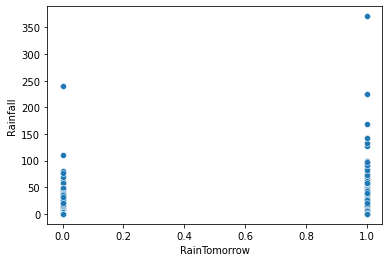

In [54]:
sns.scatterplot(x='RainTomorrow',y='Rainfall',data=Rain)

 We can see that at latitude 16 to 28 capacity of magawatt seem to be the highest
 We can see that at longitude 75 to 83 capacity of magawatt seem to be the highest
 We can see that in case of other fuel -Oil has the maximum capacity of producing electricity in megawatt and the least is congenration
Maximum meghawatt is produced by WRI
Max electricity generation in 2014 was 28127.. average generation was 1516.. generation_gwh has linear relation with target variable capacity_mw
Max electricity generation in 2015 was 30539.. average generation was 1510.. generation_gwh2015 has linear relation with target variable capacity_mw
The Primary fuel Solar has high latitude of above 20 followed by Hydro, Coal and Gas . Apart from these types others have less latitude
 

Univariate Analysis

<AxesSubplot:xlabel='Location', ylabel='Density'>

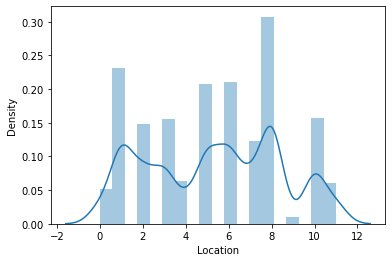

In [55]:
sns.distplot(Rain['Location'])

<AxesSubplot:xlabel='Evaporation', ylabel='Density'>

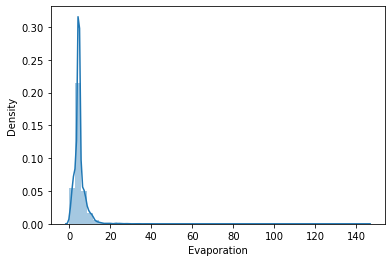

In [56]:
sns.distplot(Rain['Evaporation'])

<AxesSubplot:xlabel='Sunshine', ylabel='Density'>

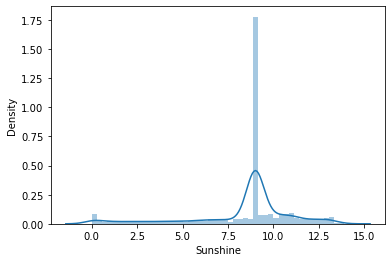

In [57]:
sns.distplot(Rain['Sunshine'])

<AxesSubplot:xlabel='Evaporation', ylabel='Density'>

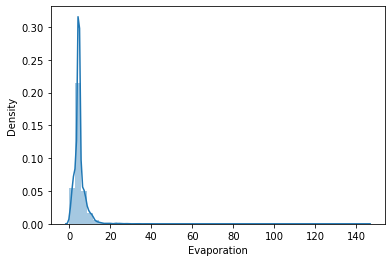

In [58]:
sns.distplot(Rain['Evaporation'])

<AxesSubplot:xlabel='Humidity9am', ylabel='Density'>

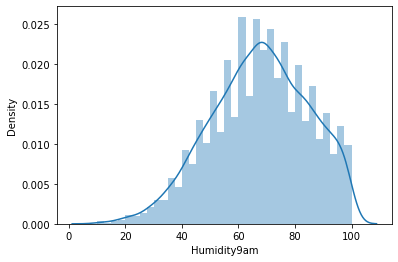

In [59]:
sns.distplot(Rain['Humidity9am'])

<AxesSubplot:xlabel='WindSpeed9am', ylabel='Density'>

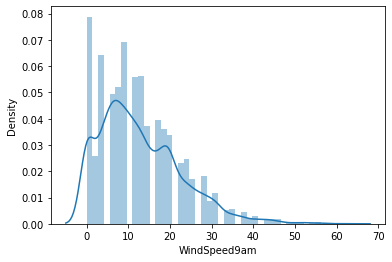

In [60]:
sns.distplot(Rain['WindSpeed9am'])

<AxesSubplot:xlabel='WindSpeed3pm', ylabel='Density'>

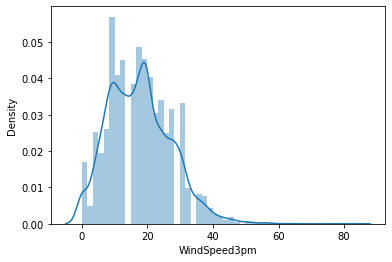

In [61]:
sns.distplot(Rain['WindSpeed3pm'])

<AxesSubplot:xlabel='Humidity3pm', ylabel='Density'>

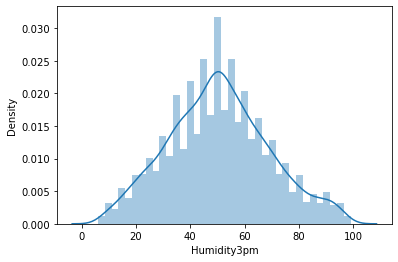

In [62]:
sns.distplot(Rain['Humidity3pm'])

<AxesSubplot:xlabel='Pressure9am', ylabel='Density'>

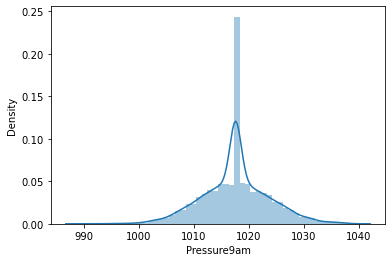

In [63]:
sns.distplot(Rain['Pressure9am'])

<AxesSubplot:xlabel='Pressure3pm', ylabel='Density'>

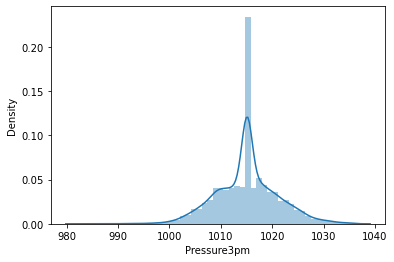

In [64]:
sns.distplot(Rain['Pressure3pm'])

<AxesSubplot:xlabel='Cloud9am', ylabel='Density'>

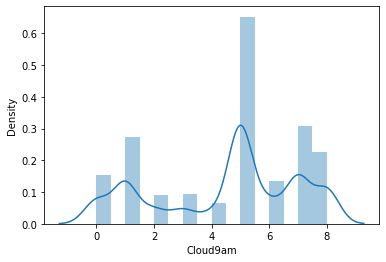

In [65]:
sns.distplot(Rain['Cloud9am'])

<AxesSubplot:xlabel='Cloud3pm', ylabel='Density'>

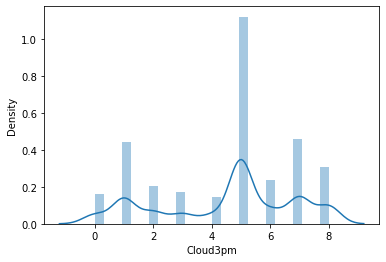

In [66]:
sns.distplot(Rain['Cloud3pm'])

<AxesSubplot:xlabel='Temp9am', ylabel='Density'>

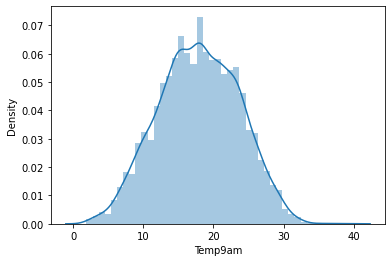

In [67]:
sns.distplot(Rain['Temp9am'])

<AxesSubplot:xlabel='Temp3pm', ylabel='Density'>

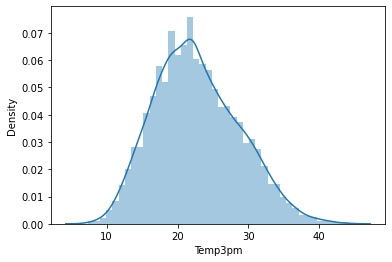

In [68]:
sns.distplot(Rain['Temp3pm'])

<AxesSubplot:xlabel='RainToday', ylabel='Density'>

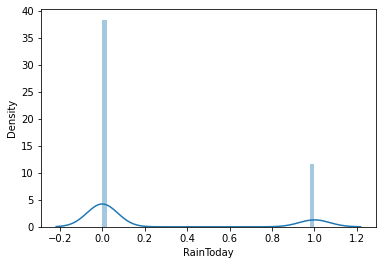

In [69]:
sns.distplot(Rain['RainToday'])

<AxesSubplot:xlabel='RainTomorrow', ylabel='Density'>

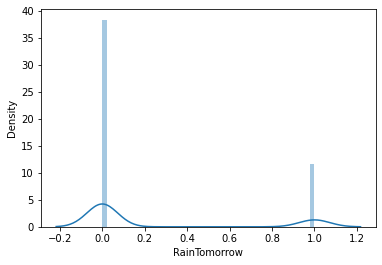

In [70]:
sns.distplot(Rain['RainTomorrow'])

Univarate and Bivarate Analysis

We can see that the maximum count is of PerthAirport and Probability of maximum rainfall for tomorrow seems to be for the same . .Uluru has the least count and rainfall for tommorrow dont seem for this place

We can see that the maximum count of 'N' direction and the probability to rain tomorrow is also from 'N' Direction and the least of both is from NNW.

We can see that the maximum count of 'SE' direction and the probability to rain tomorrow is also from 'SE' Direction and the least of both is from NNW

When there is a chance of rain today ,so there can be equal chance of rain tomorrow atleast 90%

The max probability of rain is No as per the count

As by the graph and by the mean command also ,we see that the average MinTemp is 13

As by the graph and by the mean command also ,we see that the average MaxTemp is 24

We have the average rainfall recorded in a day 3mm

evaporation (mm) in the 24 hours to 9am in average is 5mm

The direction of the strongest wind gust in the 24 hours to midnight and its average 39

Darwin and CoffsHarbour seems to be having the maximum chances of rainfall tommorrow and Uluru seems to be least having the chance

If we have sunlight from 8hrs to 10+ hrs in a day tomorrow the probability of rainfall is less and if we have sunlight for 4 to 8.5 hrs chances of rain are possible tomorrow

When the Max temp is between 18 to 27 there are possibility of rain tomorrow

We can see that MinTemp and MaxTemp have Linear Relationship to rain tomorrow column,There is slight change in Min and Max temp for the occurance of rainfall tomorrow

Till evaportation 5mm we see the maximum rainfall and if we have 5mm evaporation tomorrow we can expect rainfall

If we have a Wind Speed of 80 to 90 there are max chances of rainfall tommorrow









Multivariate Analysis

<Figure size 1800x2160 with 0 Axes>

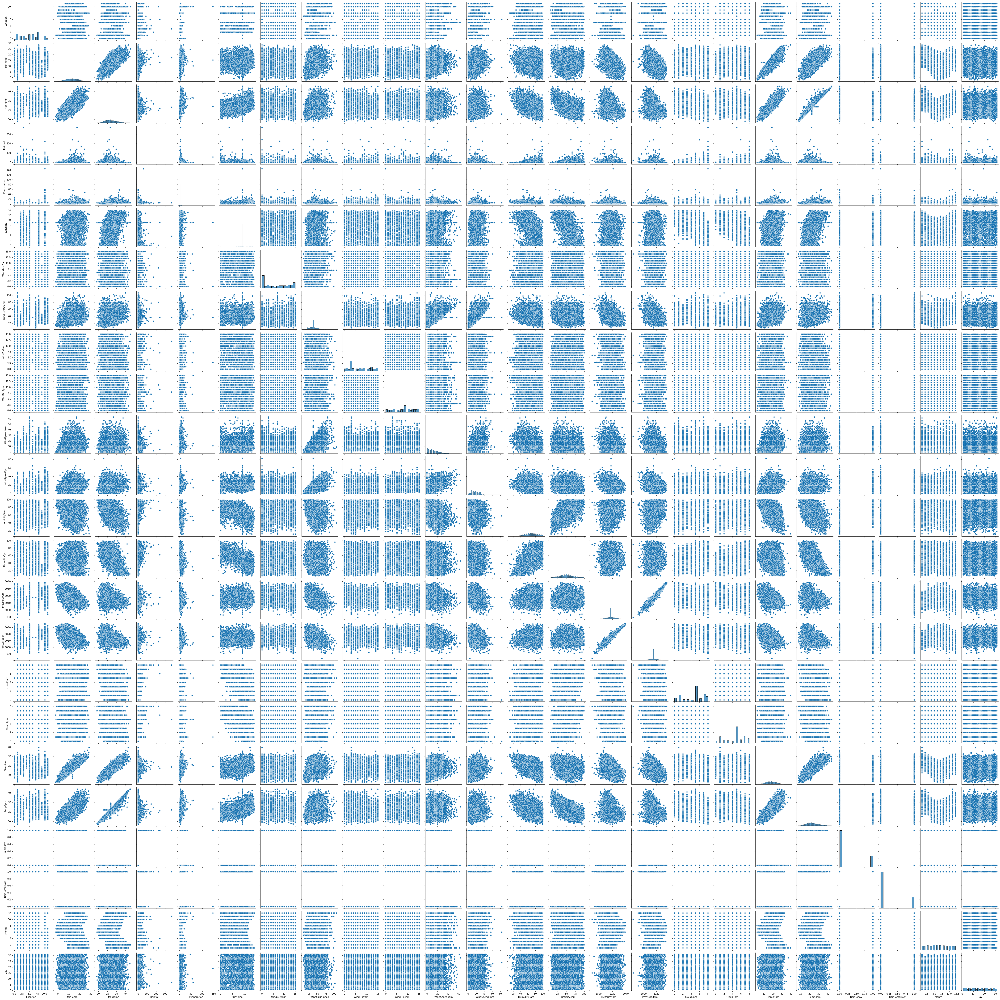

In [71]:
plt.figure(figsize=(25,30))
sns.pairplot(Rain)
plt.show()

This pair plot gives the pairwise relation between the columns which is plotted on the basis of target variable "RainTomorrow". Here we can observe the relation between the features and label.


Now Lets See that counts of each columns

In [72]:
for i in Rain.columns:
        print(Rain[i].value_counts())
        print('*'*100)

8.0     1204
1.0      907
6.0      822
5.0      811
10.0     615
3.0      611
2.0      579
7.0      482
4.0      250
11.0     237
0.0      205
9.0       39
Name: Location, dtype: int64
****************************************************************************************************
13.2    128
12.0     57
14.8     53
12.7     53
10.8     52
       ... 
26.6      1
28.0      1
26.9      1
1.4       1
26.0      1
Name: MinTemp, Length: 285, dtype: int64
****************************************************************************************************
23.5    99
19.0    66
19.8    62
22.3    54
23.8    54
        ..
38.9     1
10.3     1
9.4      1
42.5     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int64
****************************************************************************************************
0.0      4472
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
128.0       1
40.0        1
Name: Rainfall, Length:

Corelation with Target

In [73]:
Rain.corr()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
Location,1.000000,0.090455,0.070761,-0.004972,0.134965,0.068411,-0.086385,0.254955,-0.088884,-0.001275,...,-0.037942,-0.024722,-0.017268,-0.021092,0.098576,0.066010,-0.004280,-0.004506,-0.067376,-0.000710
MinTemp,0.090455,1.000000,0.728059,0.090971,0.284696,0.001976,-0.136435,0.242823,-0.020884,-0.139534,...,-0.441143,-0.440282,0.073205,0.022233,0.891417,0.696861,0.075902,0.097173,-0.237204,0.014356
MaxTemp,0.070761,0.728059,1.000000,-0.087604,0.356420,0.323262,-0.194877,0.166300,-0.192277,-0.161038,...,-0.337744,-0.413056,-0.247744,-0.246742,0.866654,0.974994,-0.225526,-0.160063,-0.171616,0.016108
Rainfall,-0.004972,0.090971,-0.087604,1.000000,-0.003746,-0.190464,0.026811,0.086519,0.091260,0.031770,...,-0.071069,-0.032681,0.184536,0.151333,-0.004365,-0.091795,0.461817,0.223599,-0.015187,-0.007989
Evaporation,0.134965,0.284696,0.356420,-0.003746,1.000000,0.251882,-0.078315,0.177502,-0.073454,-0.039664,...,-0.202387,-0.217644,-0.093375,-0.135537,0.337970,0.347958,-0.113699,-0.077340,-0.002998,0.011120
Sunshine,0.068411,0.001976,0.323262,-0.190464,0.251882,1.000000,-0.114589,-0.020876,-0.093530,-0.041657,...,0.003736,-0.050353,-0.488498,-0.515504,0.185468,0.344193,-0.249807,-0.337550,-0.005828,0.000706
WindGustDir,-0.086385,-0.136435,-0.194877,0.026811,-0.078315,-0.114589,1.000000,0.036005,0.378772,0.455305,...,-0.100428,-0.023902,0.133483,0.095415,-0.153390,-0.207326,0.112410,0.045179,0.032066,0.013606
WindGustSpeed,0.254955,0.242823,0.166300,0.086519,0.177502,-0.020876,0.036005,1.000000,-0.065090,0.076963,...,-0.393348,-0.362226,0.004758,0.042975,0.222317,0.130483,0.085641,0.184400,0.048189,-0.002539
WindDir9am,-0.088884,-0.020884,-0.192277,0.091260,-0.073454,-0.093530,0.378772,-0.065090,1.000000,0.216648,...,-0.027334,0.051862,0.079251,0.058186,-0.071205,-0.200530,0.157884,0.040399,0.019799,-0.014730
WindDir3pm,-0.001275,-0.139534,-0.161038,0.031770,-0.039664,-0.041657,0.455305,0.076963,0.216648,1.000000,...,-0.139029,-0.049335,0.075979,0.055951,-0.146437,-0.175251,0.094507,0.004301,0.034494,0.001723


We can see that some columns are Negatively correlated and some are positively correlated ..Max positively correlated column is :- Humidity3pm and Max Negetively column is :- Sunshine

<AxesSubplot:>

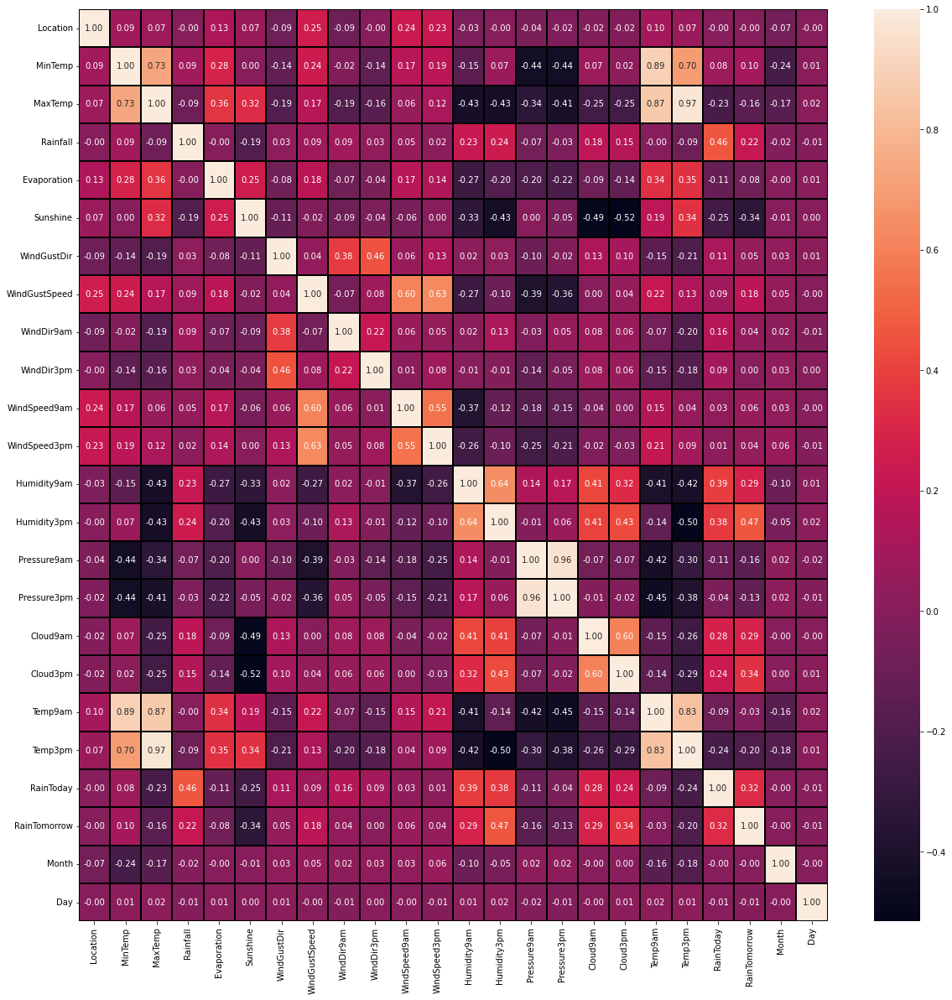

In [74]:
plt.figure(figsize = (20,20))
sns.heatmap(Rain.corr(),annot=True,linewidths=0.1,linecolor="black",fmt="0.2f")

This heatmap shows the correlation matrix by visualizing the data. we can observe the relation between feature to feature and feature to label. This heat mapcontains both positive and negative correlation.

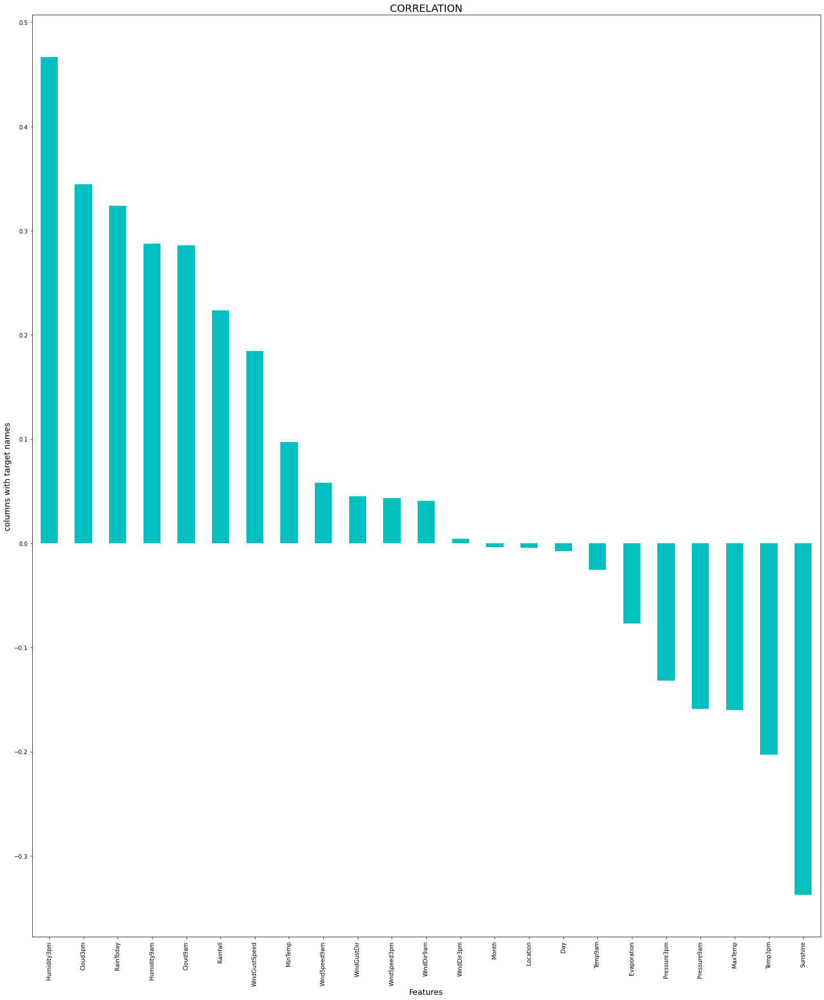

In [75]:
#checking the columns which are positively and negatively correlated
plt.figure(figsize=(25,30))
Rain.corr()['RainTomorrow'].sort_values(ascending=False).drop(['RainTomorrow']).plot(kind='bar',color='c')
plt.xlabel('Features',fontsize=14)
plt.ylabel('columns with target names',fontsize=14)
plt.title('CORRELATION',fontsize=18)
plt.show()

Here we can see the least correlated columns are-> month and the max postive and Negative correlated columns as Humidity3pm and Sunshine

In [76]:
Rain.corr()['RainTomorrow'].sort_values()

Sunshine        -0.337550
Temp3pm         -0.202781
MaxTemp         -0.160063
Pressure9am     -0.159118
Pressure3pm     -0.131771
Evaporation     -0.077340
Temp9am         -0.025768
Day             -0.007560
Location        -0.004506
Month           -0.003575
WindDir3pm       0.004301
WindDir9am       0.040399
WindSpeed3pm     0.043539
WindGustDir      0.045179
WindSpeed9am     0.057780
MinTemp          0.097173
WindGustSpeed    0.184400
Rainfall         0.223599
Cloud9am         0.285715
Humidity9am      0.287808
RainToday        0.323691
Cloud3pm         0.344434
Humidity3pm      0.466880
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

We can see that some columns are Negatively correlated and some are positively correlated ..Max positively correlated column is :- Humidity3pm and Max Negetively column is :- Sunshine

# DESCRIPTIVE STATSTICS

In [77]:
Rain.describe().T

,count,mean,std,min,25%,50%,75%,max
Location,6762.0,5.323721,3.099455,0.0,2.25,6.0,8.0,11.0
MinTemp,6762.0,13.110086,5.540674,-2.0,9.00,13.2,17.4,28.5
MaxTemp,6762.0,24.093301,6.130367,8.2,19.60,23.5,28.4,45.5
Rainfall,6762.0,2.723410,10.490138,0.0,0.00,0.0,0.8,371.0
Evaporation,6762.0,4.998980,3.361770,0.0,4.00,4.6,5.0,145.0
Sunshine,6762.0,8.421665,2.789228,0.0,8.80,9.0,9.2,13.9
WindGustDir,6762.0,6.610470,5.233746,0.0,1.00,7.0,12.0,15.0
WindGustSpeed,6762.0,38.702159,13.393977,7.0,30.00,37.0,46.0,107.0
WindDir9am,6762.0,7.013310,4.550702,0.0,3.00,7.0,11.0,15.0
WindDir3pm,6762.0,7.842798,4.486894,0.0,4.00,9.0,12.0,15.0


We can see all columns having count 6762 . Looks like it doesn't contain missing values .


<AxesSubplot:>

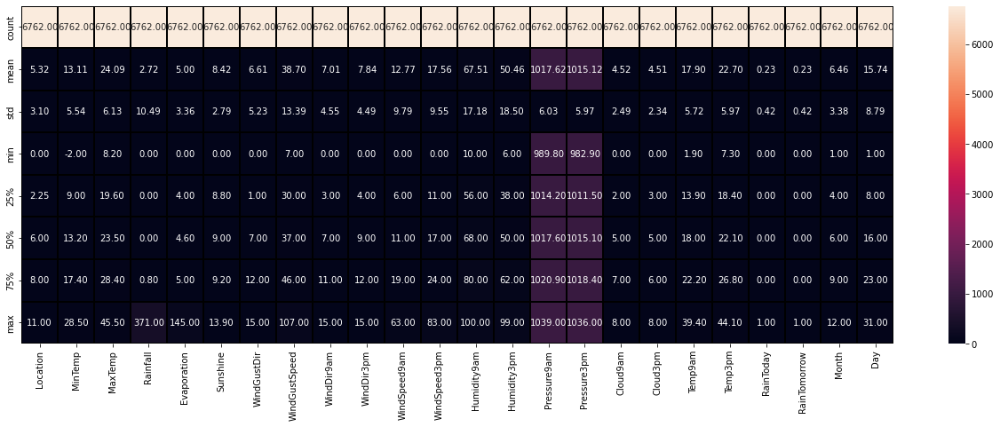

In [78]:
plt.figure(figsize = (22,7))
sns.heatmap(Rain.describe(),annot=True,linewidths=0.1,linecolor="black",fmt="0.2f")

Outcome of describe() of dataset :-
from the above plotting we are determining mean,standard deviation,minimum and maximum value of each column

Total number rows and column in dataset:-

Rows :- 6762

columns :- 24

OUTLIERS CHECKING(Any One outlier method can be  used)

In [79]:
colmlist=Rain.columns.values
ncol=30
nrows=14

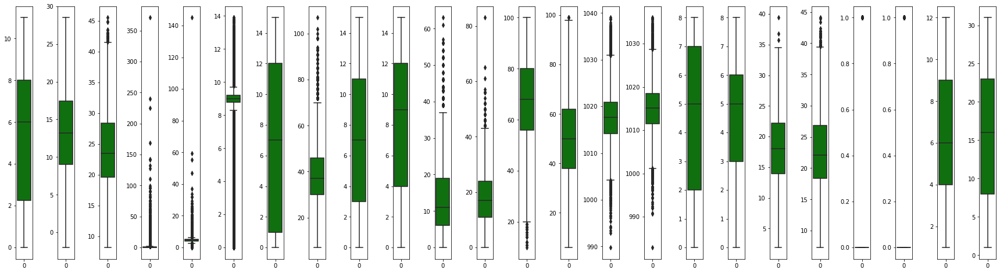

In [80]:
plt.figure(figsize=(ncol,3*ncol))
for i in range (0,len(colmlist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(data= Rain[colmlist[i]],color='green',orient='v')
    plt.tight_layout()

Location            AxesSubplot(0.125,0.125;0.0270979x0.755)
MinTemp          AxesSubplot(0.157517,0.125;0.0270979x0.755)
MaxTemp          AxesSubplot(0.190035,0.125;0.0270979x0.755)
Rainfall         AxesSubplot(0.222552,0.125;0.0270979x0.755)
Evaporation       AxesSubplot(0.25507,0.125;0.0270979x0.755)
Sunshine         AxesSubplot(0.287587,0.125;0.0270979x0.755)
WindGustDir      AxesSubplot(0.320105,0.125;0.0270979x0.755)
WindGustSpeed    AxesSubplot(0.352622,0.125;0.0270979x0.755)
WindDir9am        AxesSubplot(0.38514,0.125;0.0270979x0.755)
WindDir3pm       AxesSubplot(0.417657,0.125;0.0270979x0.755)
WindSpeed9am     AxesSubplot(0.450175,0.125;0.0270979x0.755)
WindSpeed3pm     AxesSubplot(0.482692,0.125;0.0270979x0.755)
Humidity9am       AxesSubplot(0.51521,0.125;0.0270979x0.755)
Humidity3pm      AxesSubplot(0.547727,0.125;0.0270979x0.755)
Pressure9am      AxesSubplot(0.580245,0.125;0.0270979x0.755)
Pressure3pm      AxesSubplot(0.612762,0.125;0.0270979x0.755)
Cloud9am          AxesSu

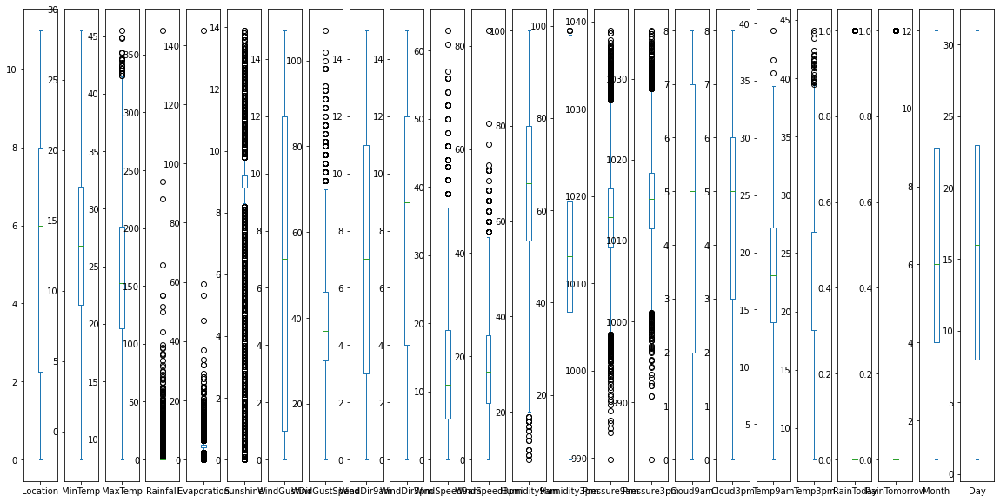

In [81]:
# to find out outliers in the dataset
Rain.plot(kind='box',subplots=True,figsize=(20,10))

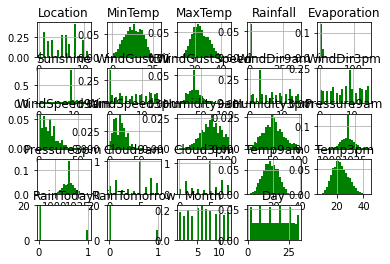

In [82]:
#Lets plot all using Histogram and see the skewness again
 
#plt.rcParams['figure.figsize']=(20,30)
Rain.hist(bins=25,color='green',density=True,label='Value',histtype='bar')
plt.show()

Rainfall,Evaporation,Sunshine,WindSpeed9am,WindSpeed3pm have skewness present and rest all columns are catagorical so no need to remove skewness

Now Lets Remove Outliers Now

In [83]:
#to check for outliers through zscore 
from scipy.stats import zscore
(np.abs(zscore(Rain)) < 3).all()

Location          True
MinTemp           True
MaxTemp          False
Rainfall         False
Evaporation      False
Sunshine         False
WindGustDir       True
WindGustSpeed    False
WindDir9am        True
WindDir3pm        True
WindSpeed9am     False
WindSpeed3pm     False
Humidity9am      False
Humidity3pm       True
Pressure9am      False
Pressure3pm      False
Cloud9am          True
Cloud3pm          True
Temp9am          False
Temp3pm          False
RainToday         True
RainTomorrow      True
Month             True
Day               True
dtype: bool

In [84]:
#to remove outliers in data set through zscore
z = np.abs(zscore( Rain))
z.shape

(6762, 24)

In [85]:
z

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,1.395097,0.052329,0.194668,0.202435,0.11869,0.207361,1.220923,0.395568,1.315650,1.372365,...,1.645999,1.343353,1.396453,0.208282,0.174035,0.150755,0.550355,0.550355,1.639768,1.675969
1,1.395097,1.030652,0.164227,0.259635,0.11869,0.207361,1.412005,0.395568,0.222688,1.595253,...,1.164869,1.226045,0.192678,0.208282,0.121606,0.267878,0.550355,0.550355,1.639768,1.562245
2,1.395097,0.037920,0.262108,0.259635,0.11869,0.207361,1.603087,0.544900,1.315650,1.595253,...,1.662590,1.075221,0.192678,1.072084,0.542498,0.083680,0.550355,0.550355,1.639768,1.448521
3,1.395097,0.705758,0.637317,0.259635,0.11869,0.207361,0.498814,1.097751,0.436600,1.748064,...,0.003521,0.388132,0.192678,0.208282,0.035682,0.636275,0.550355,0.550355,1.639768,1.334798
4,1.395097,0.792365,1.338795,0.164301,0.11869,0.207361,1.220923,0.171570,1.321500,0.187849,...,1.131688,1.527694,0.995194,1.488648,0.016748,1.172125,0.550355,0.550355,1.639768,1.221074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,1.186193,1.860937,0.113101,0.259635,0.11869,0.207361,1.263141,0.575089,0.436600,1.525176,...,1.157828,0.868739,0.192678,0.208282,1.362432,0.050283,0.550355,0.550355,0.136841,0.598504
8421,1.186193,1.716540,0.196854,0.259635,0.11869,0.207361,0.116650,1.247082,0.436600,1.079401,...,0.975330,0.667639,0.192678,0.208282,1.222621,0.301369,0.550355,0.550355,0.136841,0.712227
8422,1.186193,1.391646,0.457869,0.259635,0.11869,0.207361,0.689895,0.127093,0.436600,1.372365,...,0.560563,0.282199,0.192678,0.208282,0.942998,0.569294,0.550355,0.550355,0.136841,0.825951
8423,1.186193,0.958453,0.474183,0.259635,0.11869,0.207361,0.456596,0.799087,0.656363,1.079401,...,0.295112,0.231924,0.609839,1.072084,0.488611,0.552548,0.550355,0.550355,0.136841,0.939675


In [86]:
threshold = 3
print(np.where(z>3))

(array([   8,   12,   12,   44,   44,   52,   52,   60,   60,   61,   61,
         62,   62,   62,   67,   68,   68,  123,  267,  271,  296,  381,
        381,  405,  406,  407,  431,  462,  466,  466,  563,  567,  568,
        568,  569,  602,  602,  603,  683,  683,  699,  713,  748,  748,
        770,  795,  796,  797,  802,  928,  928,  928,  935,  941,  949,
        978,  979,  979,  980,  980,  980,  980,  981, 1007, 1008, 1008,
       1009, 1010, 1011, 1115, 1138, 1138, 1148, 1148, 1149, 1150, 1151,
       1189, 1202, 1202, 1203, 1237, 1241, 1264, 1264, 1265, 1265, 1356,
       1357, 1386, 1411, 1412, 1413, 1465, 1466, 1479, 1479, 1480, 1480,
       1481, 1486, 1513, 1513, 1535, 1587, 1644, 1661, 1665, 1673, 1680,
       1774, 1819, 1873, 1898, 1903, 1945, 2016, 2028, 2043, 2074, 2108,
       2116, 2186, 2201, 2219, 2219, 2230, 2231, 2265, 2429, 2488, 2500,
       2505, 2527, 2527, 2541, 2593, 2676, 2677, 2735, 2827, 2835, 2837,
       2849, 2849, 2855, 2859, 2863, 2869, 2877, 2

In [87]:
Rain_new=Rain[(z<3).all(axis=1)]
print(Rain_new.shape)

(6305, 24)


In [88]:
Rain_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,1.0,13.4,22.9,0.6,4.6,9.0,13.0,44.0,13.0,14.0,...,1007.7,1007.1,8.0,5.0,16.9,21.8,0.0,0.0,12,1
1,1.0,7.4,25.1,0.0,4.6,9.0,14.0,44.0,6.0,15.0,...,1010.6,1007.8,5.0,5.0,17.2,24.3,0.0,0.0,12,2
2,1.0,12.9,25.7,0.0,4.6,9.0,15.0,46.0,13.0,15.0,...,1007.6,1008.7,5.0,2.0,21.0,23.2,0.0,0.0,12,3
3,1.0,9.2,28.0,0.0,4.6,9.0,4.0,24.0,9.0,0.0,...,1017.6,1012.8,5.0,5.0,18.1,26.5,0.0,0.0,12,4
4,1.0,17.5,32.3,1.0,4.6,9.0,13.0,41.0,1.0,7.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.0,4.6,9.0,0.0,31.0,9.0,1.0,...,1024.6,1020.3,5.0,5.0,10.1,22.4,0.0,0.0,6,21
8421,9.0,3.6,25.3,0.0,4.6,9.0,6.0,22.0,9.0,3.0,...,1023.5,1019.1,5.0,5.0,10.9,24.5,0.0,0.0,6,22
8422,9.0,5.4,26.9,0.0,4.6,9.0,3.0,37.0,9.0,14.0,...,1021.0,1016.8,5.0,5.0,12.5,26.1,0.0,0.0,6,23
8423,9.0,7.8,27.0,0.0,4.6,9.0,9.0,28.0,10.0,3.0,...,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,0.0,6,24


In [89]:
Rain.shape

(6762, 24)

In [90]:
Rain_new.shape

(6305, 24)

In [91]:
print ("Old DataFrame =",Rain.shape)
print ("New DataFrame =",Rain_new.shape)
print ("Total dropped rows = ",Rain.shape[0] - Rain_new.shape[0])

Old DataFrame = (6762, 24)
New DataFrame = (6305, 24)
Total dropped rows =  457


In [92]:
#to find % loss in data
loss = (6762-6305)/6762* 100
print(loss)

6.758355516119491


In [93]:
Rain_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,1.0,13.4,22.9,0.6,4.6,9.0,13.0,44.0,13.0,14.0,...,1007.7,1007.1,8.0,5.0,16.9,21.8,0.0,0.0,12,1
1,1.0,7.4,25.1,0.0,4.6,9.0,14.0,44.0,6.0,15.0,...,1010.6,1007.8,5.0,5.0,17.2,24.3,0.0,0.0,12,2
2,1.0,12.9,25.7,0.0,4.6,9.0,15.0,46.0,13.0,15.0,...,1007.6,1008.7,5.0,2.0,21.0,23.2,0.0,0.0,12,3
3,1.0,9.2,28.0,0.0,4.6,9.0,4.0,24.0,9.0,0.0,...,1017.6,1012.8,5.0,5.0,18.1,26.5,0.0,0.0,12,4
4,1.0,17.5,32.3,1.0,4.6,9.0,13.0,41.0,1.0,7.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.0,4.6,9.0,0.0,31.0,9.0,1.0,...,1024.6,1020.3,5.0,5.0,10.1,22.4,0.0,0.0,6,21
8421,9.0,3.6,25.3,0.0,4.6,9.0,6.0,22.0,9.0,3.0,...,1023.5,1019.1,5.0,5.0,10.9,24.5,0.0,0.0,6,22
8422,9.0,5.4,26.9,0.0,4.6,9.0,3.0,37.0,9.0,14.0,...,1021.0,1016.8,5.0,5.0,12.5,26.1,0.0,0.0,6,23
8423,9.0,7.8,27.0,0.0,4.6,9.0,9.0,28.0,10.0,3.0,...,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,0.0,6,24


Now Lets Split the dataset into dependent and independent variable*

In [94]:
#seperate feature variable and target variable
x = Rain_new.drop (['RainTomorrow'], axis = 1)
y = Rain_new['RainTomorrow']

In [95]:
x.shape

(6305, 23)

In [96]:
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Month,Day
0,1.0,13.4,22.9,0.6,4.6,9.0,13.0,44.0,13.0,14.0,...,22.0,1007.7,1007.1,8.0,5.0,16.9,21.8,0.0,12,1
1,1.0,7.4,25.1,0.0,4.6,9.0,14.0,44.0,6.0,15.0,...,25.0,1010.6,1007.8,5.0,5.0,17.2,24.3,0.0,12,2
2,1.0,12.9,25.7,0.0,4.6,9.0,15.0,46.0,13.0,15.0,...,30.0,1007.6,1008.7,5.0,2.0,21.0,23.2,0.0,12,3
3,1.0,9.2,28.0,0.0,4.6,9.0,4.0,24.0,9.0,0.0,...,16.0,1017.6,1012.8,5.0,5.0,18.1,26.5,0.0,12,4
4,1.0,17.5,32.3,1.0,4.6,9.0,13.0,41.0,1.0,7.0,...,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.0,4.6,9.0,0.0,31.0,9.0,1.0,...,24.0,1024.6,1020.3,5.0,5.0,10.1,22.4,0.0,6,21
8421,9.0,3.6,25.3,0.0,4.6,9.0,6.0,22.0,9.0,3.0,...,21.0,1023.5,1019.1,5.0,5.0,10.9,24.5,0.0,6,22
8422,9.0,5.4,26.9,0.0,4.6,9.0,3.0,37.0,9.0,14.0,...,24.0,1021.0,1016.8,5.0,5.0,12.5,26.1,0.0,6,23
8423,9.0,7.8,27.0,0.0,4.6,9.0,9.0,28.0,10.0,3.0,...,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,6,24


In [97]:
# Target or dependent variable

y

0       0.0
1       0.0
2       0.0
3       0.0
4       0.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: RainTomorrow, Length: 6305, dtype: float64

In [98]:
y.shape

(6305,)

# TRANSFORMING DATA TO REMOVE SKEWNESS

Now Lets Remove Skewness Now

In [99]:
Rain_new.skew()

Location        -0.005041
MinTemp         -0.073640
MaxTemp          0.263690
Rainfall         3.572436
Evaporation      1.136753
Sunshine        -1.358828
WindGustDir      0.109246
WindGustSpeed    0.544830
WindDir9am       0.214975
WindDir3pm      -0.128511
WindSpeed9am     0.680216
WindSpeed3pm     0.342765
Humidity9am     -0.224837
Humidity3pm      0.139294
Pressure9am      0.067423
Pressure3pm      0.088337
Cloud9am        -0.400423
Cloud3pm        -0.370944
Temp9am         -0.075437
Temp3pm          0.288331
RainToday        1.371384
RainTomorrow     1.383878
Month            0.030646
Day              0.005324
dtype: float64

Here We have skewness ,. Now remove the skewness from the given columns

In [100]:
from sklearn.preprocessing import power_transform
x_new=power_transform(Rain_new,method='yeo-johnson')

In [101]:
pd.DataFrame(x_new).skew()

0    -0.191397
1    -0.112861
2    -0.017020
3     1.089584
4     0.059545
5    -0.097213
6    -0.251568
7     0.008831
8    -0.147875
9    -0.256236
10   -0.132272
11   -0.077871
12   -0.066520
13   -0.036839
14   -0.001572
15    0.000000
16   -0.331526
17   -0.280016
18   -0.063894
19   -0.014954
20    1.371384
21    1.383878
22   -0.151110
23   -0.212162
dtype: float64

We can see that the skewness has been removed from the given columns  .

In [102]:
# It will be a 2 dimensional data contaning rows and columns

from sklearn.preprocessing import StandardScaler
#transforming my dataset into a standard normal distribution
sc=StandardScaler()

x= pd.DataFrame(sc.fit_transform(x), columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Month,Day
0,-1.390820,0.076961,-0.200778,-0.253612,-0.100377,0.154322,1.224412,0.506080,1.321318,1.371163,...,-1.561154,-1.767186,-1.440770,1.434875,0.247573,-0.163278,-0.159443,-0.526886,1.653994,-1.671897
1,-1.390820,-1.005480,0.164759,-0.383028,-0.100377,0.154322,1.415150,0.506080,-0.221198,1.594258,...,-1.393447,-1.258439,-1.316916,0.226798,0.247573,-0.110642,0.267119,-0.526886,1.653994,-1.558125
2,-1.390820,-0.013242,0.264451,-0.383028,-0.100377,0.154322,1.605888,0.669973,1.321318,1.594258,...,-1.113937,-1.784729,-1.157675,0.226798,-1.040693,0.556076,0.079432,-0.526886,1.653994,-1.444353
3,-1.390820,-0.680748,0.646603,-0.383028,-0.100377,0.154322,-0.492227,-1.132851,0.439880,-1.752177,...,-1.896566,-0.030428,-0.432243,0.226798,0.247573,0.047265,0.642493,-0.526886,1.653994,-1.330582
4,-1.390820,0.816629,1.361061,-0.167335,-0.100377,0.154322,1.224412,0.260240,-1.322996,-0.190507,...,-0.946231,-1.223353,-1.635398,1.032183,1.535840,-0.005371,1.188493,-0.526886,1.653994,-1.216810
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6300,1.194987,-1.835352,-0.117701,-0.383028,-0.100377,0.154322,-1.255179,-0.559225,0.439880,-1.529081,...,-1.449350,1.197582,0.894768,0.226798,0.247573,-1.356351,-0.057068,-0.526886,-0.135987,0.603542
6301,1.194987,-1.691026,0.197990,-0.383028,-0.100377,0.154322,-0.110752,-1.296744,0.439880,-1.082890,...,-1.617056,1.004609,0.682446,0.226798,0.247573,-1.215990,0.301244,-0.526886,-0.135987,0.717314
6302,1.194987,-1.366294,0.463834,-0.383028,-0.100377,0.154322,-0.682965,-0.067546,0.439880,1.371163,...,-1.449350,0.566034,0.275496,0.226798,0.247573,-0.935267,0.574244,-0.526886,-0.135987,0.831086
6303,1.194987,-0.933317,0.480450,-0.383028,-0.100377,0.154322,0.461461,-0.805065,0.660240,-1.082890,...,-1.449350,0.285346,0.222416,-0.578587,-1.040693,-0.479091,0.557181,-0.526886,-0.135987,0.944858


In [103]:
smt=SMOTE()
x,y=smt.fit_resample(x,y)

In [104]:
x.mean()

Location         0.015075
MinTemp          0.044760
MaxTemp         -0.119034
Rainfall         0.163294
Evaporation     -0.085434
Sunshine        -0.205931
WindGustDir      0.020394
WindGustSpeed    0.109483
WindDir9am       0.025910
WindDir3pm       0.005406
WindSpeed9am     0.027198
WindSpeed3pm     0.016242
Humidity9am      0.191264
Humidity3pm      0.321161
Pressure9am     -0.082979
Pressure3pm     -0.066343
Cloud9am         0.189722
Cloud3pm         0.228693
Temp9am         -0.030892
Temp3pm         -0.147520
RainToday        0.191878
Month           -0.010044
Day             -0.000867
dtype: float64

In [105]:
x.std()

Location         0.982469
MinTemp          0.971727
MaxTemp          0.979024
Rainfall         1.163538
Evaporation      0.928651
Sunshine         1.077445
WindGustDir      0.970519
WindGustSpeed    1.018033
WindDir9am       0.972574
WindDir3pm       0.955302
WindSpeed9am     0.981305
WindSpeed3pm     1.013823
Humidity9am      0.970703
Humidity3pm      1.043854
Pressure9am      0.982195
Pressure3pm      0.985069
Cloud9am         0.954749
Cloud3pm         0.953212
Temp9am          0.970448
Temp3pm          0.983401
RainToday        1.102514
Month            0.960516
Day              0.967595
dtype: float64

Balancing the dataset over here,otherwise it will be a baised dataset

In [106]:
x.shape

(9892, 23)

In [107]:
y.value_counts()

0.0    4946
1.0    4946
Name: RainTomorrow, dtype: int64

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

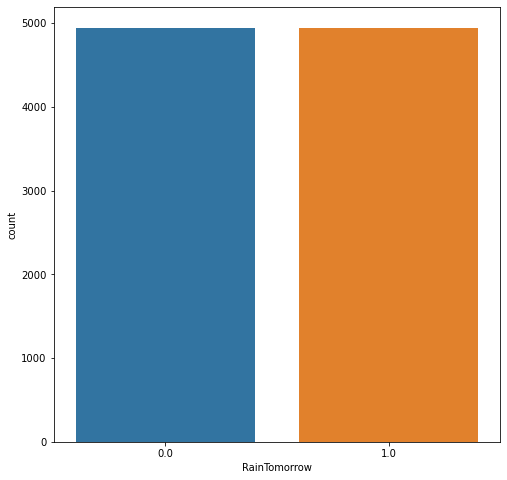

In [108]:
plt.figure(figsize=(8,8))
sns.countplot(y)

Now Lets Whether Multicollinearity is present in the dataset or not 

WE CHECK MULTICOLLINEARITY BY VARIANCE INFLATION FACTOR (VIF)

In [109]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [110]:
vif_cal()

    VIF FACTOR       FEATURES
0     1.155436       Location
1    10.161782        MinTemp
2    24.694650        MaxTemp
3     2.070410       Rainfall
4     1.656222    Evaporation
5     1.779677       Sunshine
6     1.514033    WindGustDir
7     2.320845  WindGustSpeed
8     1.392353     WindDir9am
9     1.409200     WindDir3pm
10    2.216896   WindSpeed9am
11    2.030142   WindSpeed3pm
12    4.564423    Humidity9am
13    6.569107    Humidity3pm
14   20.007200    Pressure9am
15   19.134761    Pressure3pm
16    2.084180       Cloud9am
17    2.025695       Cloud3pm
18   20.163702        Temp9am
19   33.886528        Temp3pm
20    2.378145      RainToday
21    1.177189          Month
22    1.008255            Day


In [111]:
x.drop('MaxTemp',axis=1,inplace=True)

In [112]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [113]:
vif_cal()

    VIF FACTOR       FEATURES
0     1.155435       Location
1    10.142920        MinTemp
2     2.069166       Rainfall
3     1.649096    Evaporation
4     1.779655       Sunshine
5     1.512433    WindGustDir
6     2.295184  WindGustSpeed
7     1.391571     WindDir9am
8     1.408347     WindDir3pm
9     2.196298   WindSpeed9am
10    2.030093   WindSpeed3pm
11    4.521333    Humidity9am
12    6.373163    Humidity3pm
13   20.001759    Pressure9am
14   19.134539    Pressure3pm
15    2.069992       Cloud9am
16    2.005826       Cloud3pm
17   19.775673        Temp9am
18   13.634667        Temp3pm
19    2.373658      RainToday
20    1.170131          Month
21    1.008250            Day


Many feature are highly multi related So we will drophighest VIF values

In [114]:
x.drop('Pressure9am',axis=1,inplace=True)

In [115]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [116]:
vif_cal()

    VIF FACTOR       FEATURES
0     1.153183       Location
1    10.041600        MinTemp
2     2.065642       Rainfall
3     1.643145    Evaporation
4     1.779503       Sunshine
5     1.504009    WindGustDir
6     2.281606  WindGustSpeed
7     1.361761     WindDir9am
8     1.317305     WindDir3pm
9     2.196258   WindSpeed9am
10    2.022968   WindSpeed3pm
11    4.491661    Humidity9am
12    6.286482    Humidity3pm
13    1.383586    Pressure3pm
14    2.069929       Cloud9am
15    2.003091       Cloud3pm
16   19.584585        Temp9am
17   12.920588        Temp3pm
18    2.370910      RainToday
19    1.168981          Month
20    1.007251            Day


In [117]:
x.drop('Temp3pm',axis=1,inplace=True)

In [118]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [119]:
vif_cal()

    VIF FACTOR       FEATURES
0     1.153072       Location
1    10.036492        MinTemp
2     2.065627       Rainfall
3     1.636980    Evaporation
4     1.776499       Sunshine
5     1.501156    WindGustDir
6     2.281605  WindGustSpeed
7     1.334592     WindDir9am
8     1.308249     WindDir3pm
9     2.193662   WindSpeed9am
10    1.989492   WindSpeed3pm
11    3.534597    Humidity9am
12    2.296627    Humidity3pm
13    1.381093    Pressure3pm
14    2.068488       Cloud9am
15    2.003069       Cloud3pm
16   11.012853        Temp9am
17    2.339058      RainToday
18    1.152184          Month
19    1.007194            Day


In [120]:
Rain.drop('Pressure9am',axis=1,inplace=True)

In [121]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [122]:
vif_cal()

    VIF FACTOR       FEATURES
0     1.153072       Location
1    10.036492        MinTemp
2     2.065627       Rainfall
3     1.636980    Evaporation
4     1.776499       Sunshine
5     1.501156    WindGustDir
6     2.281605  WindGustSpeed
7     1.334592     WindDir9am
8     1.308249     WindDir3pm
9     2.193662   WindSpeed9am
10    1.989492   WindSpeed3pm
11    3.534597    Humidity9am
12    2.296627    Humidity3pm
13    1.381093    Pressure3pm
14    2.068488       Cloud9am
15    2.003069       Cloud3pm
16   11.012853        Temp9am
17    2.339058      RainToday
18    1.152184          Month
19    1.007194            Day


In [123]:
x.drop('Temp9am',axis=1,inplace=True)

In [124]:
def vif_cal():
    vif=pd.DataFrame()
    vif["VIF FACTOR"]=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
    vif["FEATURES"]=x.columns
    print (vif)

In [125]:
vif_cal()

    VIF FACTOR       FEATURES
0     1.142379       Location
1     1.637355        MinTemp
2     2.063554       Rainfall
3     1.635520    Evaporation
4     1.768863       Sunshine
5     1.499315    WindGustDir
6     2.250475  WindGustSpeed
7     1.325441     WindDir9am
8     1.305577     WindDir3pm
9     2.098345   WindSpeed9am
10    1.967318   WindSpeed3pm
11    2.759469    Humidity9am
12    2.278782    Humidity3pm
13    1.369726    Pressure3pm
14    1.978324       Cloud9am
15    2.001461       Cloud3pm
16    2.328322      RainToday
17    1.148444          Month
18    1.007186            Day


 Let's move to buliding machine learning models...

Model Training and Testing

Now Lets Train and Test the model using Regression Models

In [1522]:
# to predict best random state value
maxAcc =0
maxRS=0

for i in range(1,6305):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.20,random_state=i)
    LR = LogisticRegression()
    LR.fit(x_train,y_train)
    predrf = LR.predict(x_test)
    acc=accuracy_score(y_test,predrf)
    if acc>maxAcc:
        maxAcc=acc
        maxRS=i
print('Best accuracy is',maxAcc,'on Random_State',maxRS)

Best accuracy is 0.8039413845376453 on Random_State 2989


In [1523]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=2989)

In [1524]:
x_train

,Location,MinTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,Month,Day
2846,1.518213,0.221287,-0.383028,-0.284661,0.154322,0.270724,0.096347,1.541678,0.032589,0.761552,1.415798,-0.913424,0.060007,0.169335,-1.383972,-1.470116,-0.526886,-1.030978,1.741261
5164,0.871761,0.546019,-0.383028,1.926746,1.613976,-1.255179,1.489439,-1.543355,-1.529081,2.094031,0.754209,-1.328746,-1.337545,-0.113760,-1.786664,-1.040693,-0.526886,1.355664,-1.671897
943,-0.744368,-0.193649,-0.383028,-1.574649,0.312122,0.270724,-1.296744,0.219521,0.478780,-0.348847,-0.679235,0.688529,1.233951,0.452431,-0.981279,-1.040693,-0.526886,-0.434318,1.399945
986,-0.744368,-1.420416,-0.383028,-1.113939,-1.620933,0.079986,-0.641172,-0.000839,-0.413603,0.095313,-0.679235,-0.616766,0.451322,-1.086901,0.226798,1.106418,-0.526886,0.162343,-0.079090
6663,-0.317118,0.386969,0.005220,-1.882318,-1.822268,0.015309,0.364318,-0.658115,-0.118708,-0.345014,0.200981,0.949045,1.211137,-0.830048,1.032183,0.538795,1.897944,0.748707,1.288137
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4601,-1.067594,-0.680748,-0.383028,-0.745371,0.509373,1.605888,-1.460637,1.762037,1.594258,-0.348847,-1.671620,-0.676098,-0.499014,0.647059,-1.786664,-1.899538,-0.526886,-0.135987,0.262226
5181,0.871761,-0.193649,-0.081057,-0.284661,1.298375,1.033675,0.424134,0.660240,0.924971,-0.126767,1.415798,-1.269414,-1.113937,0.169335,-0.981279,-1.470116,1.897944,1.355664,0.262226
2612,0.548536,-1.853393,-0.339890,-0.100377,0.154322,-1.064441,-1.460637,-0.221198,-0.859794,-0.681966,-0.899765,1.815830,-0.387210,-0.025293,0.226798,0.247573,-0.526886,-0.135987,-1.330582
7814,1.518213,0.684650,0.320808,-0.100377,0.154322,0.310860,0.997759,0.068716,0.079535,0.142045,0.777412,1.100756,0.139436,-0.117500,1.434875,1.490659,1.897944,-1.030978,-0.773692


In [1525]:
x_test

,Location,MinTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure3pm,Cloud9am,Cloud3pm,RainToday,Month,Day
6018,0.871761,0.203246,-0.339890,-1.666791,-2.370485,-0.110752,-0.231439,-0.441558,-1.082890,-0.126767,-0.238176,0.688529,-0.331308,-0.432243,0.629490,0.247573,-0.526886,-0.135987,-0.761722
8768,-0.744368,1.000909,2.012778,-0.858076,-2.138019,0.270724,0.108539,1.100959,0.392126,0.940502,1.168844,1.378440,1.436767,0.373468,1.434875,0.907679,1.897944,0.371904,1.085894
6139,-0.421142,0.509938,-0.383028,0.360333,0.864423,-1.255179,0.096347,-1.102636,-0.190507,1.760911,-0.458706,-1.388077,-0.666720,-1.157675,-1.786664,-1.470116,-0.526886,0.162343,-0.989266
4151,-1.067594,1.051158,-0.383028,2.295314,1.180024,-0.873703,-0.067546,0.660240,0.255684,-0.348847,-0.679235,-1.091419,-0.387210,-1.210755,-0.578587,-1.040693,-0.526886,-1.627639,0.831086
9801,0.548536,1.349142,0.168050,-0.100377,0.154322,0.649167,-0.705947,0.038328,-0.769846,-1.083122,-0.810852,1.139261,-0.126682,-0.025293,0.226798,0.247573,1.897944,-1.507358,1.036599
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
522,-1.390820,-1.312172,-0.339890,-0.100377,0.154322,0.652199,-2.198156,-0.882277,0.478780,-1.348205,-0.899765,1.459840,0.507224,0.487818,1.434875,1.535840,-0.526886,-0.434318,1.286173
730,-1.390820,0.491897,-0.383028,-0.100377,0.154322,-0.682965,0.669973,-1.102636,-1.082890,-1.126126,-0.899765,-0.735430,-1.561154,-0.803805,0.226798,0.247573,-0.526886,1.653994,1.741261
8733,-1.067594,1.966232,-0.242008,1.222910,0.154322,-1.082066,-0.767878,-0.811915,-0.636698,-0.656771,-0.679235,-0.225873,0.341871,-0.056665,-0.487217,-1.275245,0.023305,-1.329309,-1.304767
2234,0.225310,-1.258050,-0.383028,-0.100377,0.154322,-1.255179,-0.067546,-0.000839,0.255684,-0.348847,-0.017646,-0.676098,0.004105,-0.025293,-0.175895,0.247573,-0.526886,0.759003,-1.558125


In [1526]:
y_train

2846    0.0
5164    0.0
943     1.0
986     0.0
6663    1.0
       ... 
4601    0.0
5181    0.0
2612    1.0
7814    1.0
4005    0.0
Name: RainTomorrow, Length: 6924, dtype: float64

In [1527]:
y_test

6018    1.0
8768    1.0
6139    0.0
4151    0.0
9801    1.0
       ... 
522     0.0
730     0.0
8733    1.0
2234    1.0
6520    1.0
Name: RainTomorrow, Length: 2968, dtype: float64

  REGRESSION,ENSEMBLE TECHNIQUE(GradientBoostingClassifier,RandomForestClassifier)

In [1528]:
lg=LogisticRegression()
gnb=GaussianNB()
svc=SVC()
dtc=DecisionTreeClassifier()
knn=KNeighborsClassifier()
gb = GradientBoostingClassifier()
RF = RandomForestClassifier()
ada = AdaBoostClassifier()
et = ExtraTreesClassifier()

model=[lg,gnb,svc,dtc,knn,RF,gb,ada,et]
for m in model:
    m.fit(x_train,y_train)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    print("Accuracy_score:",m,'is')
    print(confusion_matrix(y_test, predm))
    print(accuracy_score(y_test,predm))
    print(classification_report(y_test,predm))
    print('\n')

Accuracy_score: LogisticRegression() is
[[1210  301]
 [ 334 1123]]
0.7860512129380054
              precision    recall  f1-score   support

         0.0       0.78      0.80      0.79      1511
         1.0       0.79      0.77      0.78      1457

    accuracy                           0.79      2968
   macro avg       0.79      0.79      0.79      2968
weighted avg       0.79      0.79      0.79      2968



Accuracy_score: GaussianNB() is
[[1174  337]
 [ 412 1045]]
0.7476415094339622
              precision    recall  f1-score   support

         0.0       0.74      0.78      0.76      1511
         1.0       0.76      0.72      0.74      1457

    accuracy                           0.75      2968
   macro avg       0.75      0.75      0.75      2968
weighted avg       0.75      0.75      0.75      2968



Accuracy_score: SVC() is
[[1249  262]
 [ 202 1255]]
0.8436657681940701
              precision    recall  f1-score   support

         0.0       0.86      0.83      0.84      151

In [1529]:
#cross validation to check the accuracy score
print('cross validation score of random forest model = ', cross_val_score(RF,x,y,cv=None).mean())
print('cross validation score of logistic regression model = ', cross_val_score(lg,x,y,cv=None).mean())
print('cross validation score of decison tree model = ', cross_val_score(dtc,x,y,cv=None).mean())
print('cross validation score of  KNeighborsClassifier model = ', cross_val_score(knn,x,y,cv=None).mean())
print('cross validation score of standard vector machine model = ', cross_val_score(svc,x,y,cv=None).mean())
print('cross validation score of GaussianNB model = ', cross_val_score(gnb,x,y,cv=None).mean())
print('cross validation score of AdaBoostingClassifier model = ',cross_val_score(ada,x,y,cv=None).mean())
print('cross validation score of GradientBoostingClassifier model = ',cross_val_score(gb,x,y,cv=None).mean())
print('cross validation score of ExtraTreesClassifier model = ',cross_val_score(gb,x,y,cv=None).mean())

cross validation score of random forest model =  0.731417957308054
cross validation score of logistic regression model =  0.7188697195170116
cross validation score of decison tree model =  0.6894631241790059
cross validation score of  KNeighborsClassifier model =  0.714633837293605
cross validation score of standard vector machine model =  0.7187761178930846
cross validation score of GaussianNB model =  0.7197744159989291
cross validation score of AdaBoostingClassifier model =  0.6420553833451442
cross validation score of GradientBoostingClassifier model =  0.6720805055713914
cross validation score of ExtraTreesClassifier model =  0.6716760566330698


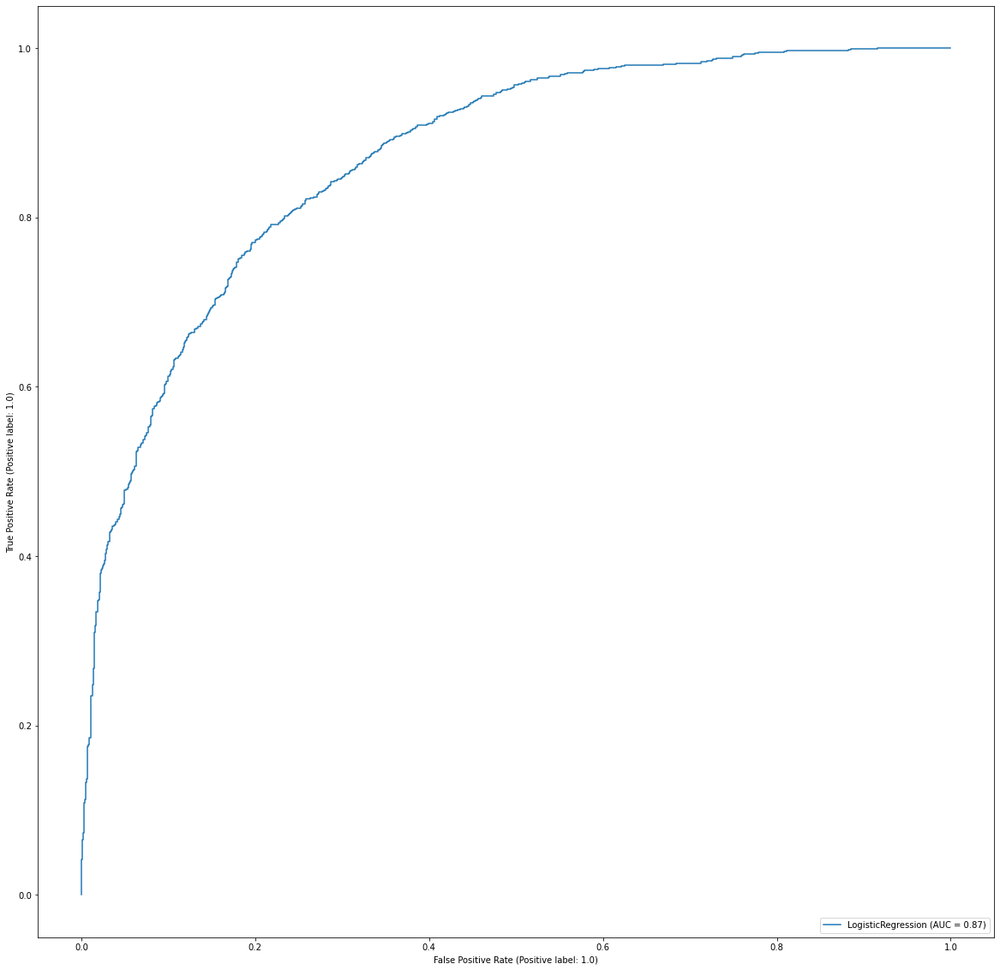

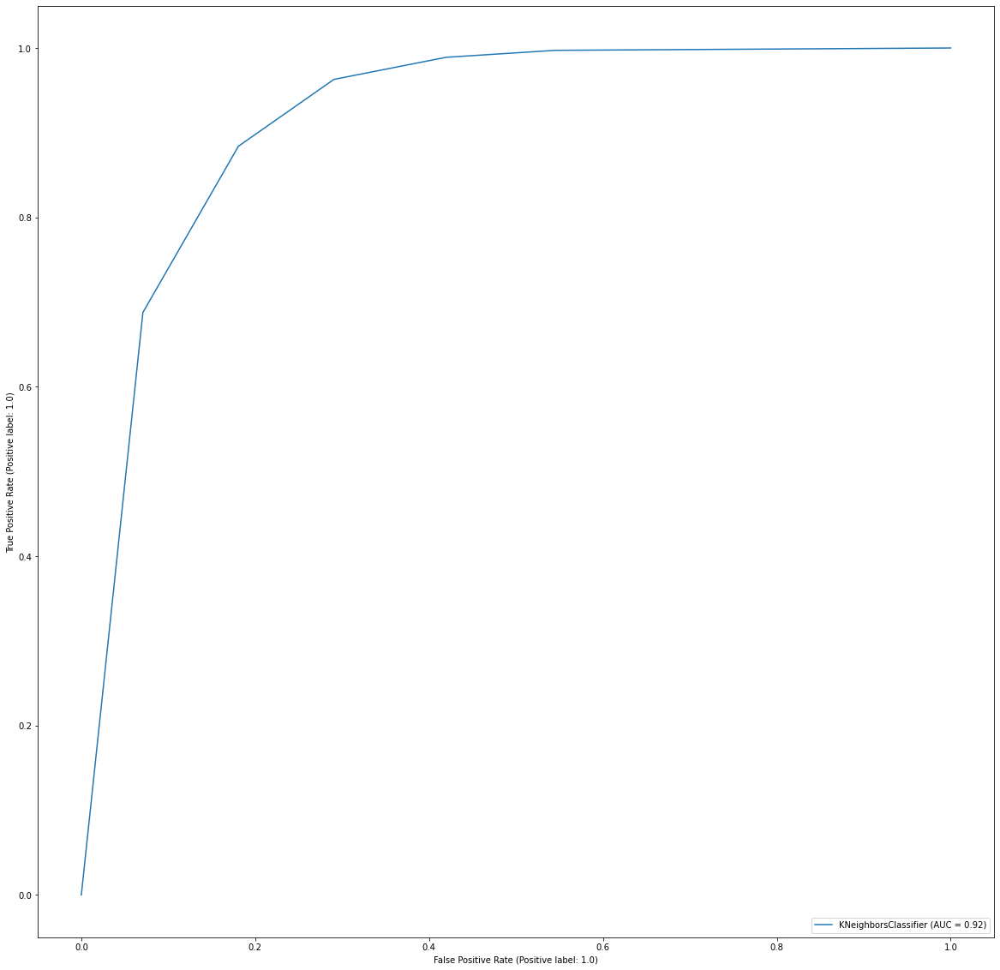

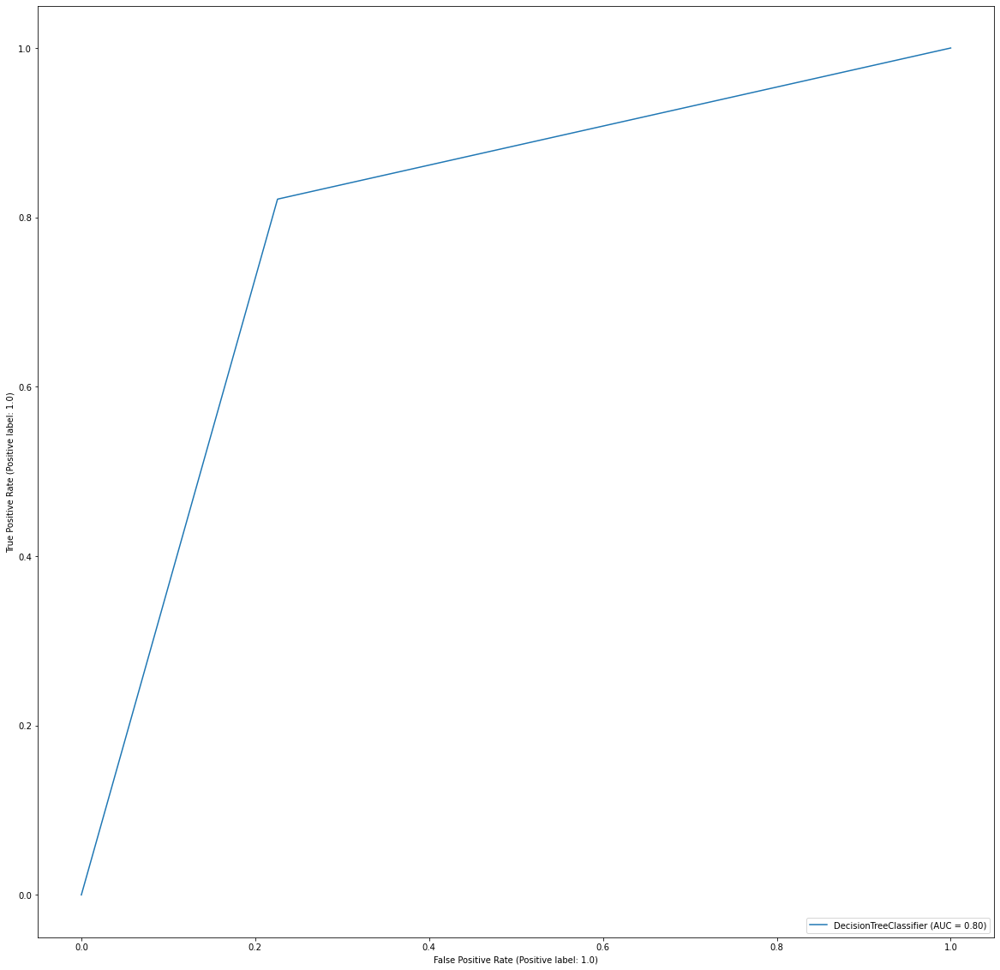

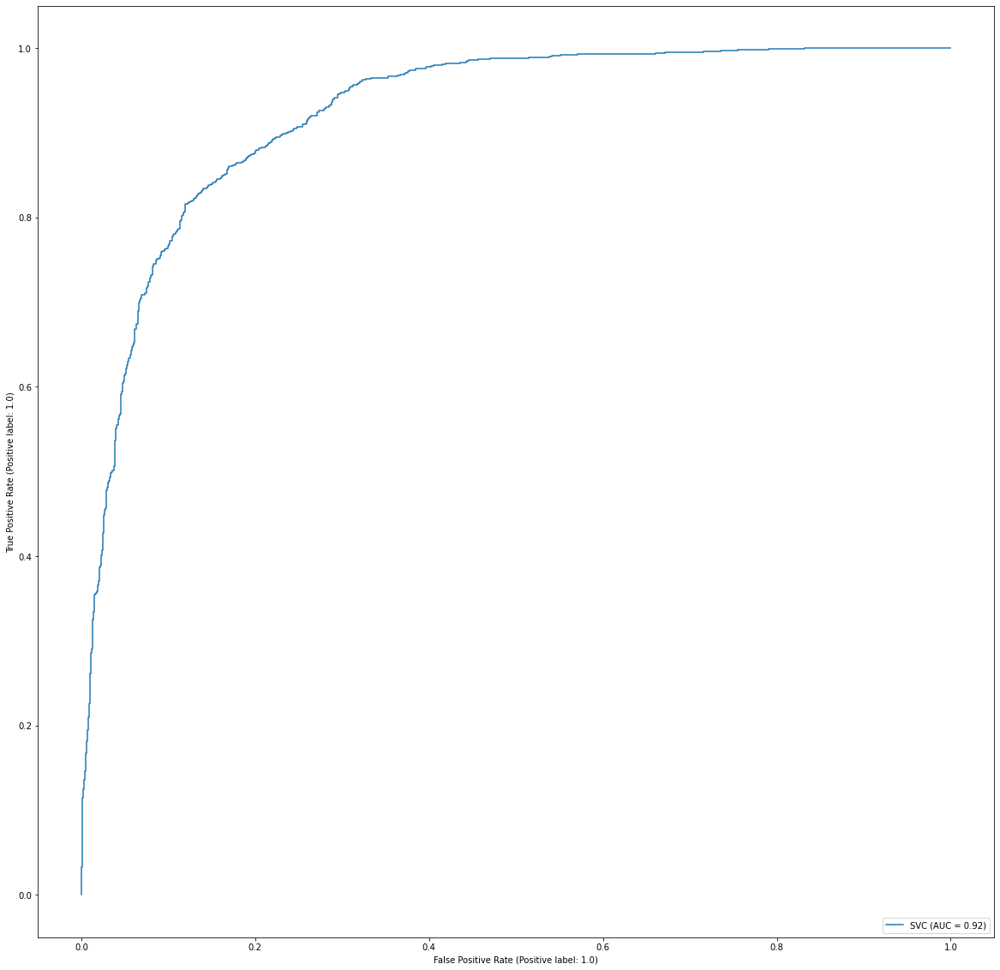

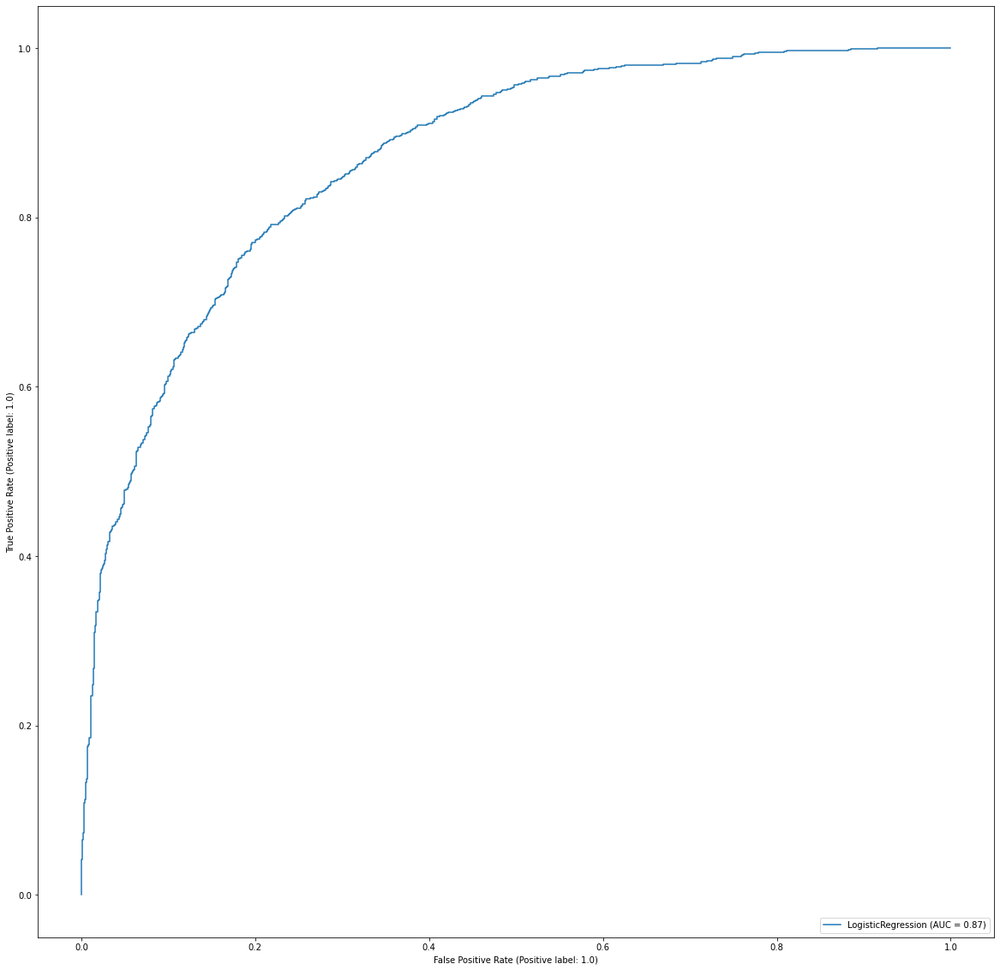

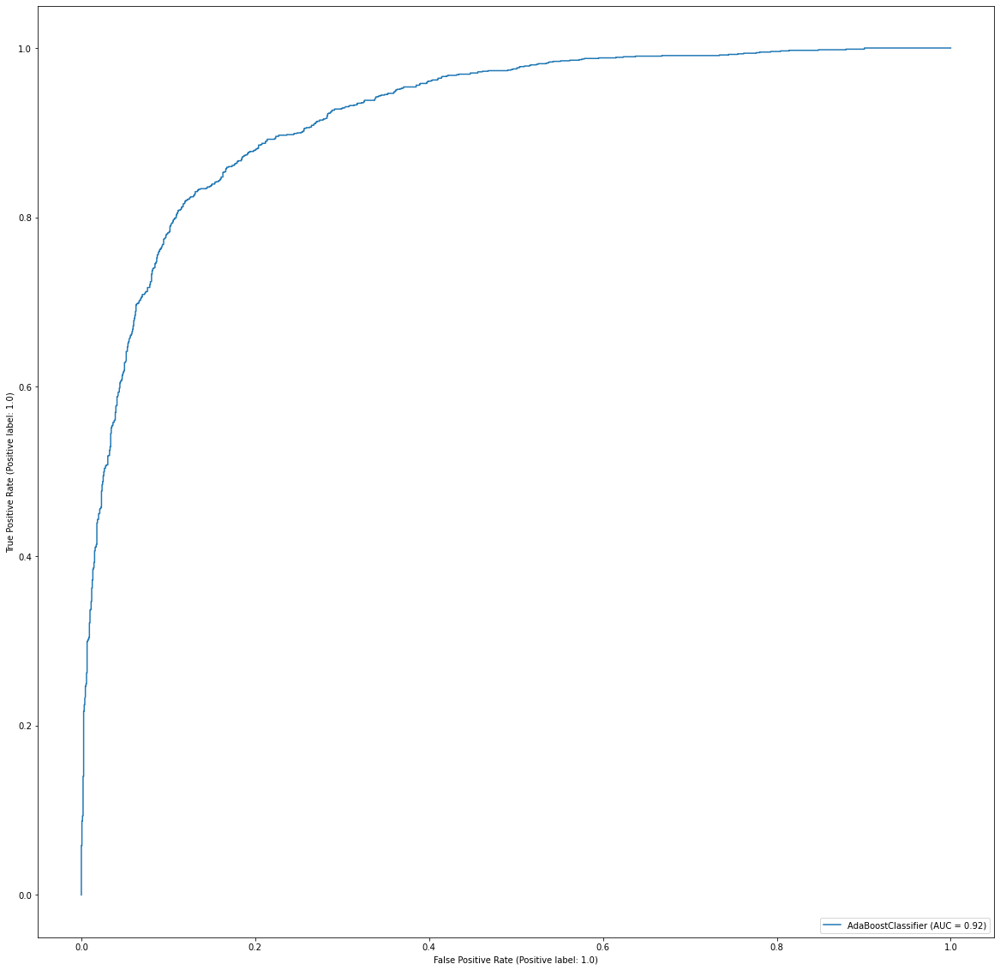

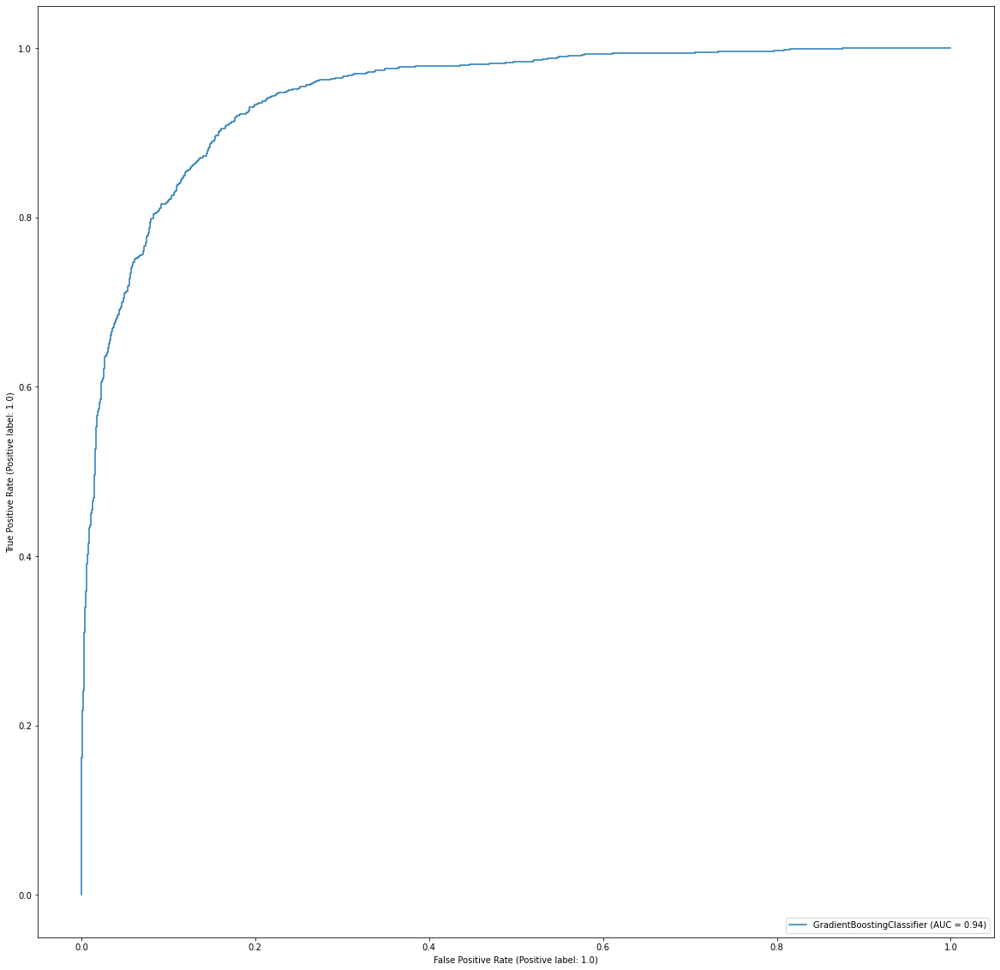

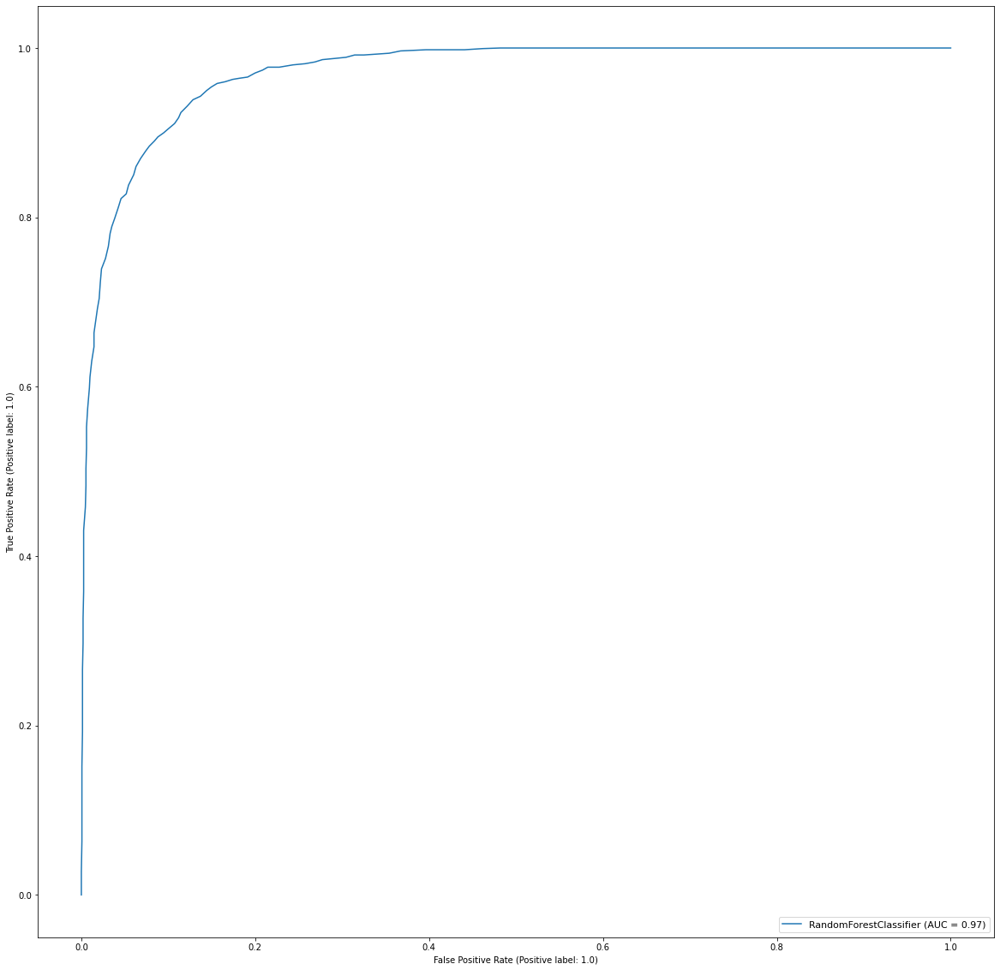

In [1530]:
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import roc_curve
disp=RocCurveDisplay.from_estimator(lg, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(knn, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(dtc, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(svc, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(lg, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(ada, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(gb, x_test, y_test)
svc_disp = RocCurveDisplay.from_estimator(RF, x_test, y_test)
#rfc_disp = RocCurveDisplay.from_estimator(rfc, x_test, y_test, ax=svc_disp.ax_)
plt.legend(prop={'size':11}, loc='lower right')
plt.show()


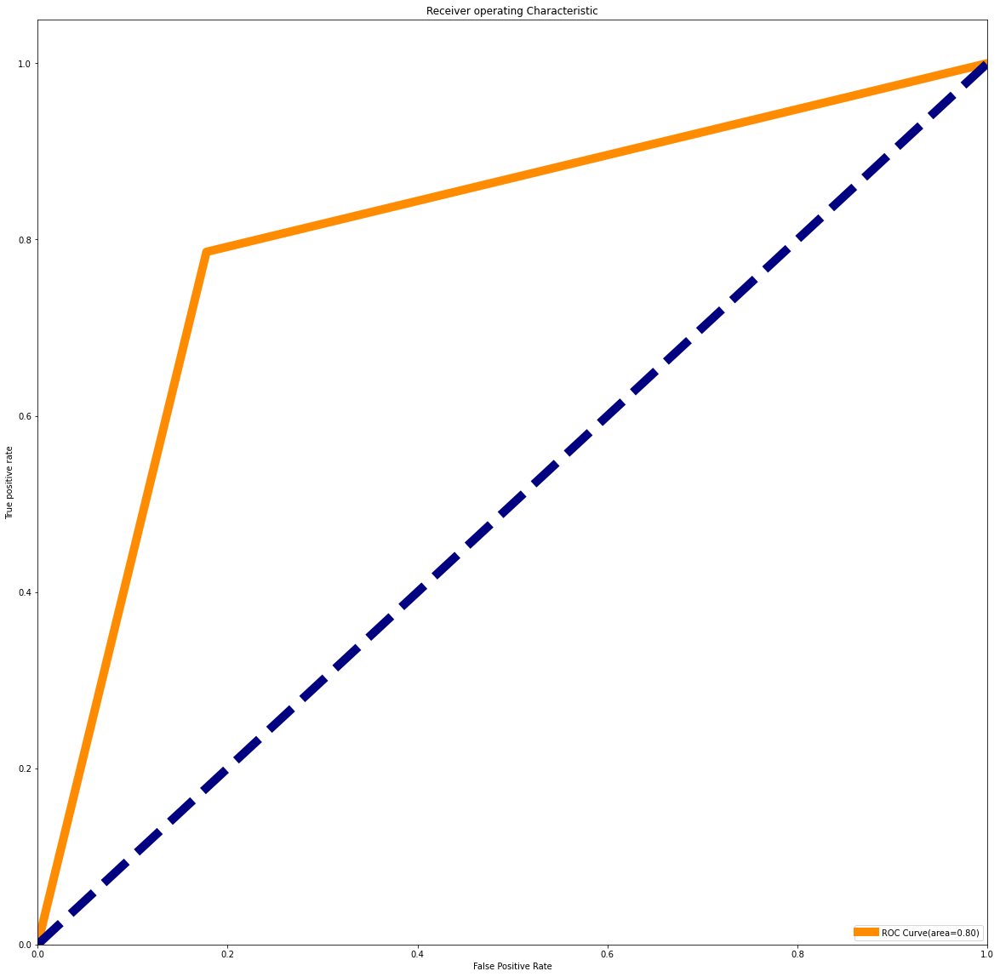

In [1531]:
gsv=GridSearchCV
dtc.fit(x_train,y_train)
y_pred=dtc.predict(x_test)
from sklearn.metrics import roc_curve,auc
fpr,tpr,thresholds=roc_curve(y_pred,y_test)
roc_auc=auc(fpr,tpr)

plt.figure()
plt.plot(fpr,tpr,color='darkorange',lw=10,label='ROC Curve(area=%0.2f)' % roc_auc)
plt.plot([0,1],[0,1],color='navy',lw=10,linestyle='--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True positive rate')
plt.title('Receiver operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [1532]:

# hyperparameter tuning with RandomForestClassifier, parameters of RandomForestClassifier
parameters ={'n_estimators':[200], 'criterion':['gini'], 
             'min_samples_split':[5], 'min_samples_leaf':[2], 
              'bootstrap':[True],'n_jobs':[-1], 'random_state':[35]}

In [1533]:
# hyperparameter tuning with gridsearchCV
gcv = GridSearchCV(RandomForestClassifier(random_state=35), parameters, verbose=1, cv=10, n_jobs=-1)

Now Lets consider model which Model should we go for as a final model

Hyper parameter tuning

In [1534]:
#training the model
gcv.fit(x_train,y_train)

Fitting 10 folds for each of 1 candidates, totalling 10 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=35),
             n_jobs=-1,
             param_grid={'bootstrap': [True], 'criterion': ['gini'],
                         'min_samples_leaf': [2], 'min_samples_split': [5],
                         'n_estimators': [200], 'n_jobs': [-1],
                         'random_state': [35]},
             verbose=1)

In [1535]:
#finding out which parameter is giving best accuracy
gcv.best_params_

{'bootstrap': True,
 'criterion': 'gini',
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'n_estimators': 200,
 'n_jobs': -1,
 'random_state': 35}

In [1536]:
type(gcv)

sklearn.model_selection._search.GridSearchCV

In [1537]:
# finding best estimator
gcv.best_estimator_

RandomForestClassifier(min_samples_leaf=2, min_samples_split=5,
                       n_estimators=200, n_jobs=-1, random_state=35)

In [1538]:
# Applying the parameters to the final model
pred = gcv.best_estimator_.predict(x_test)
acc =accuracy_score(y_test,pred)
print(acc*100)

89.92587601078166


In [1539]:
#saving the model
import joblib
joblib.dump(gcv,'RainPred.pkl')

['RainPred.pkl']

Prediction

In [1540]:
#Loading the saved model
RP=joblib.load('RainPred.pkl')

In [1541]:
prediction = RP.predict(x_test)
prediction

array([1., 1., 0., ..., 1., 0., 1.])

In [1542]:
pd.DataFrame([RP.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,...,2958,2959,2960,2961,2962,2963,2964,2965,2966,2967
Predicted,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
Original,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0


<AxesSubplot:xlabel='RainTomorrow', ylabel='Density'>

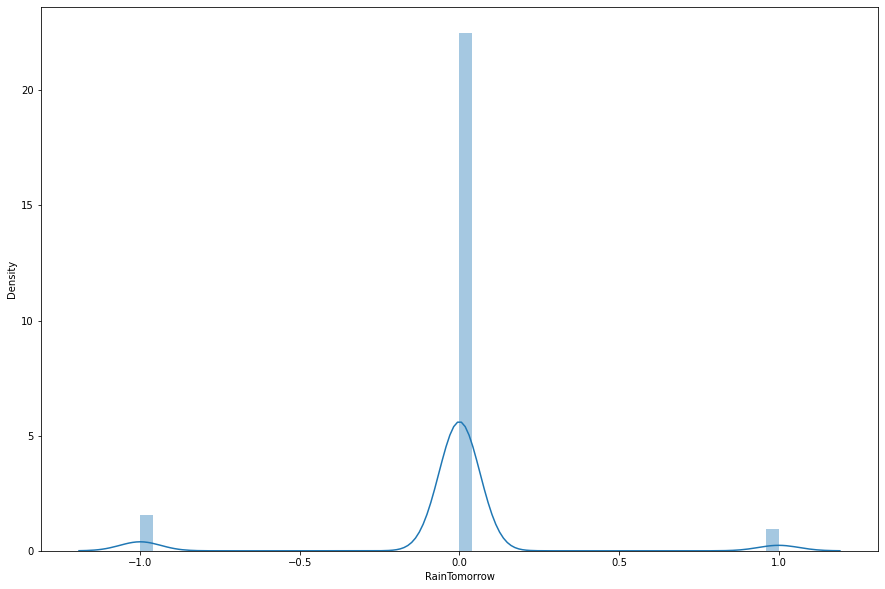

In [1543]:
plt.figure(figsize=(15,10))
sns.distplot(y_test-prediction)

In [1544]:
import pickle
filename = 'RainPred'
pickle.dump(gcv ,open(filename, 'wb'))

In [1545]:
loaded_model = pickle.load(open(filename, 'rb'))
predicted = gcv.score(x_test,y_test)*100
print(predicted)

89.92587601078166


<AxesSubplot:xlabel='RainTomorrow', ylabel='Density'>

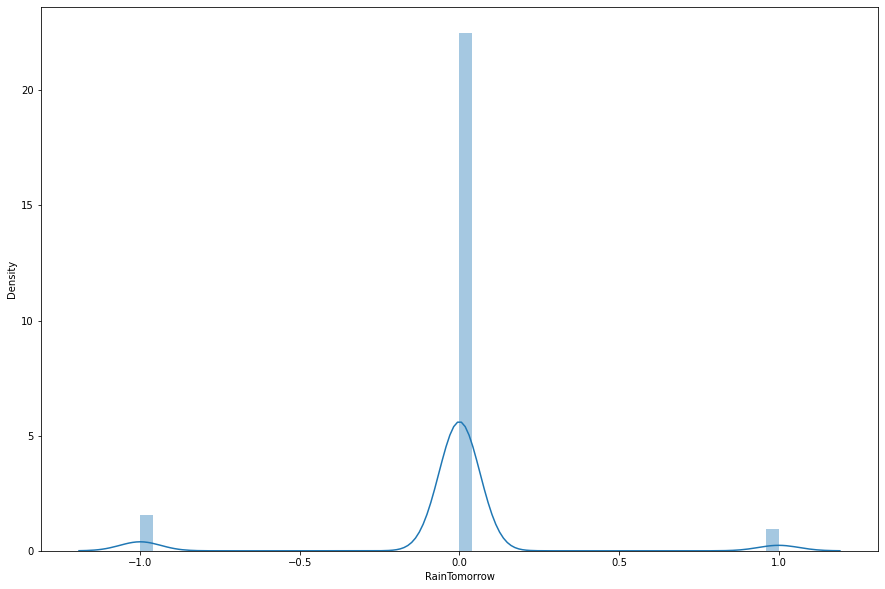

In [1546]:
plt.figure(figsize=(15,10))
sns.distplot(y_test-prediction)

# Power project as Classifier problem


In [1547]:
import pandas as pd
import numpy as np
import matplotlib
from matplotlib import pyplot as plt
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn import tree
from sklearn.preprocessing import power_transform
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import ExtraTreesRegressor
from scipy.stats.mstats import normaltest
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score
from sklearn.metrics import accuracy_score,roc_curve, roc_auc_score
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import roc_curve
from sklearn.metrics  import roc_auc_score
from sklearn.metrics import r2_score
from scipy.stats.mstats import normaltest
import warnings
warnings.filterwarnings('ignore')

Extracting the Data

In [1548]:
Rain_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,1.0,13.4,22.9,0.6,4.6,9.0,13.0,44.0,13.0,14.0,...,1007.7,1007.1,8.0,5.0,16.9,21.8,0.0,0.0,12,1
1,1.0,7.4,25.1,0.0,4.6,9.0,14.0,44.0,6.0,15.0,...,1010.6,1007.8,5.0,5.0,17.2,24.3,0.0,0.0,12,2
2,1.0,12.9,25.7,0.0,4.6,9.0,15.0,46.0,13.0,15.0,...,1007.6,1008.7,5.0,2.0,21.0,23.2,0.0,0.0,12,3
3,1.0,9.2,28.0,0.0,4.6,9.0,4.0,24.0,9.0,0.0,...,1017.6,1012.8,5.0,5.0,18.1,26.5,0.0,0.0,12,4
4,1.0,17.5,32.3,1.0,4.6,9.0,13.0,41.0,1.0,7.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,0.0,4.6,9.0,0.0,31.0,9.0,1.0,...,1024.6,1020.3,5.0,5.0,10.1,22.4,0.0,0.0,6,21
8421,9.0,3.6,25.3,0.0,4.6,9.0,6.0,22.0,9.0,3.0,...,1023.5,1019.1,5.0,5.0,10.9,24.5,0.0,0.0,6,22
8422,9.0,5.4,26.9,0.0,4.6,9.0,3.0,37.0,9.0,14.0,...,1021.0,1016.8,5.0,5.0,12.5,26.1,0.0,0.0,6,23
8423,9.0,7.8,27.0,0.0,4.6,9.0,9.0,28.0,10.0,3.0,...,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,0.0,6,24


In [1549]:
#Frequency of 'RainTomorrow'
Rain_new['Rainfall'].value_counts()

0.0     4261
0.2      299
0.4      137
0.6       81
1.2       64
        ... 
2.5        1
2.9        1
31.1       1
23.8       1
26.8       1
Name: Rainfall, Length: 166, dtype: int64

<AxesSubplot:xlabel='Rainfall', ylabel='count'>

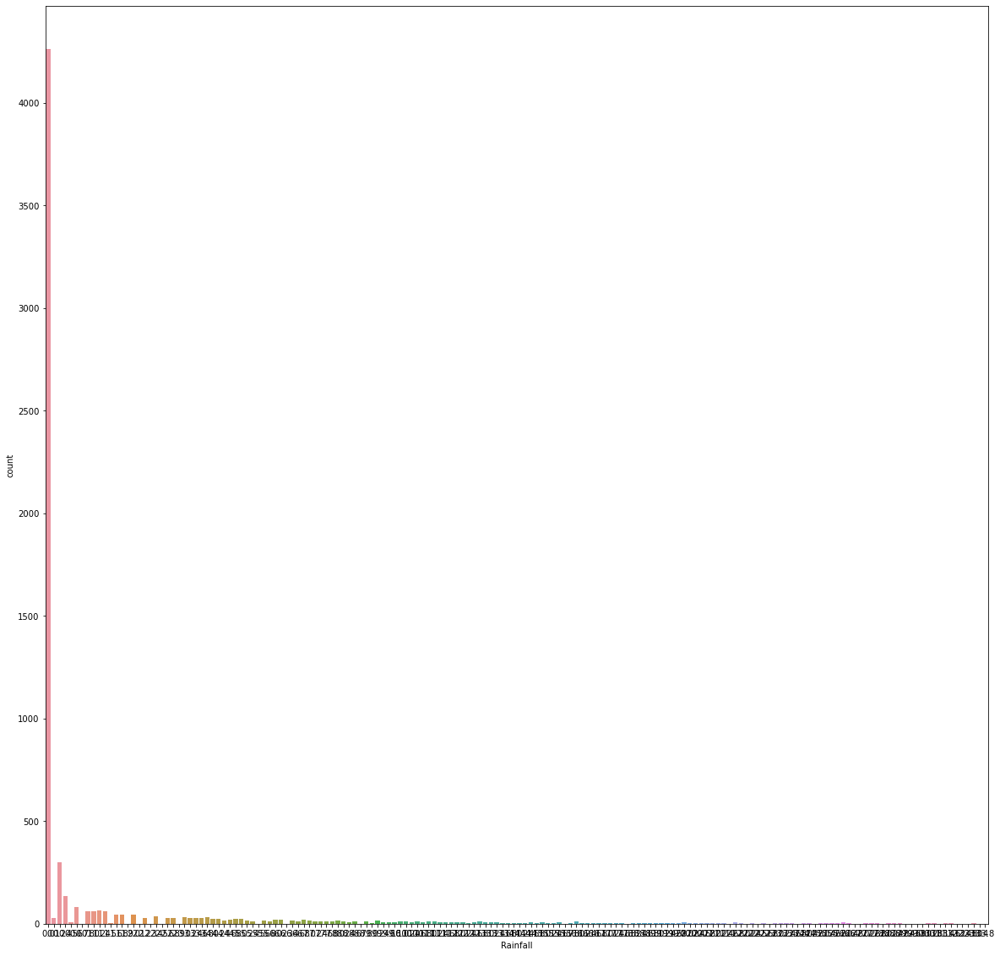

In [1550]:
# Plotting the 'Rainfall' frequency
sns.countplot(data=Rain_new,x='Rainfall')

In [1551]:
#Normalizing the frequency table of 'RainTomorrow' variable
Rain_new['Rainfall'].value_counts(normalize=True)

0.0     0.675813
0.2     0.047423
0.4     0.021729
0.6     0.012847
1.2     0.010151
          ...   
2.5     0.000159
2.9     0.000159
31.1    0.000159
23.8    0.000159
26.8    0.000159
Name: Rainfall, Length: 166, dtype: float64

In [1552]:
vif_cal()

    VIF FACTOR       FEATURES
0     1.133947       Location
1     1.641645        MinTemp
2     2.136948       Rainfall
3     1.637263    Evaporation
4     1.771269       Sunshine
5     1.473251    WindGustDir
6     2.188068  WindGustSpeed
7     1.308627     WindDir9am
8     1.288604     WindDir3pm
9     2.097273   WindSpeed9am
10    1.969519   WindSpeed3pm
11    2.803109    Humidity9am
12    2.284070    Humidity3pm
13    1.359032    Pressure3pm
14    1.955059       Cloud9am
15    1.976713       Cloud3pm
16    2.385972      RainToday
17    1.134608          Month
18    1.006064            Day


In [1553]:
#seperate feature variable and target variable
x = Rain_new.drop (['Rainfall'], axis = 1)
y = Rain_new['Rainfall']

In [1554]:
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
0,1.0,13.4,22.9,4.6,9.0,13.0,44.0,13.0,14.0,20.0,...,1007.7,1007.1,8.0,5.0,16.9,21.8,0.0,0.0,12,1
1,1.0,7.4,25.1,4.6,9.0,14.0,44.0,6.0,15.0,4.0,...,1010.6,1007.8,5.0,5.0,17.2,24.3,0.0,0.0,12,2
2,1.0,12.9,25.7,4.6,9.0,15.0,46.0,13.0,15.0,19.0,...,1007.6,1008.7,5.0,2.0,21.0,23.2,0.0,0.0,12,3
3,1.0,9.2,28.0,4.6,9.0,4.0,24.0,9.0,0.0,11.0,...,1017.6,1012.8,5.0,5.0,18.1,26.5,0.0,0.0,12,4
4,1.0,17.5,32.3,4.6,9.0,13.0,41.0,1.0,7.0,7.0,...,1010.8,1006.0,7.0,8.0,17.8,29.7,0.0,0.0,12,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9.0,2.8,23.4,4.6,9.0,0.0,31.0,9.0,1.0,13.0,...,1024.6,1020.3,5.0,5.0,10.1,22.4,0.0,0.0,6,21
8421,9.0,3.6,25.3,4.6,9.0,6.0,22.0,9.0,3.0,13.0,...,1023.5,1019.1,5.0,5.0,10.9,24.5,0.0,0.0,6,22
8422,9.0,5.4,26.9,4.6,9.0,3.0,37.0,9.0,14.0,9.0,...,1021.0,1016.8,5.0,5.0,12.5,26.1,0.0,0.0,6,23
8423,9.0,7.8,27.0,4.6,9.0,9.0,28.0,10.0,3.0,13.0,...,1019.4,1016.5,3.0,2.0,15.1,26.0,0.0,0.0,6,24


In [1555]:
y

0       0.6
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: Rainfall, Length: 6305, dtype: float64

In [1556]:
# to find out best random state
max_r2=0
maxRs=0
for i in range(0,6305):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred_train=lr.predict(x_train)
    pred_test=lr.predict(x_test)
    r2_score1=r2_score(y_test,pred_test)
    if r2_score1>max_r2:
        max_r2=r2_score1
        maxRs=i
print("Best r2_score is ", max_r2,"on Random_State",maxRs)

Best r2_score is  0.5608237305581028 on Random_State 4129


In [1557]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=4129)

In [1558]:
x_train

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
6983,8.0,18.9,33.5,9.2,13.2,12.0,39.0,0.0,15.0,17.0,...,1011.5,1007.9,0.0,0.0,24.7,31.6,0.0,0.0,1,18
3056,10.0,13.2,20.8,5.6,9.0,14.0,50.0,14.0,14.0,31.0,...,1018.4,1018.0,5.0,5.0,16.7,20.1,0.0,0.0,6,10
2405,7.0,5.2,16.5,4.6,9.0,5.0,15.0,3.0,3.0,2.0,...,1017.6,1015.1,5.0,5.0,7.8,15.0,0.0,0.0,7,24
1547,6.0,3.8,18.2,4.6,9.0,0.0,37.0,7.0,9.0,4.0,...,1017.6,1015.1,0.0,3.0,8.5,16.3,0.0,1.0,7,8
2152,6.0,19.8,31.2,4.6,9.0,0.0,37.0,7.0,9.0,19.0,...,1017.6,1015.1,2.0,1.0,25.6,27.5,0.0,0.0,3,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6225,2.0,14.3,24.9,4.0,9.6,12.0,19.0,12.0,13.0,7.0,...,1020.4,1016.5,6.0,6.0,19.6,23.3,0.0,0.0,5,6
4721,5.0,19.0,24.5,3.8,3.0,6.0,54.0,7.0,15.0,20.0,...,1007.9,1005.7,7.0,6.0,20.1,21.8,1.0,0.0,4,24
2762,7.0,5.8,13.1,4.6,9.0,5.0,26.0,5.0,1.0,17.0,...,1017.6,1015.1,5.0,5.0,8.4,12.7,1.0,1.0,7,16
4875,5.0,10.9,19.9,2.8,6.5,12.0,54.0,6.0,15.0,22.0,...,1014.8,1014.0,5.0,5.0,13.6,19.0,0.0,0.0,9,25


In [1559]:
x_test

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Month,Day
7004,8.0,20.9,33.8,10.2,11.8,0.0,41.0,1.0,15.0,30.0,...,1009.9,1005.5,1.0,5.0,27.9,33.1,0.0,0.0,2,8
1670,6.0,14.7,34.8,4.6,9.0,0.0,37.0,3.0,4.0,4.0,...,1017.6,1015.1,0.0,1.0,23.0,33.5,0.0,0.0,11,8
6887,0.0,20.6,24.1,7.6,9.0,9.0,37.0,1.0,10.0,9.0,...,1011.9,1011.9,5.0,5.0,22.9,23.6,0.0,0.0,11,14
6477,2.0,20.8,28.1,10.6,9.7,0.0,28.0,0.0,1.0,6.0,...,1016.4,1013.6,5.0,5.0,24.8,25.9,0.0,0.0,1,13
6382,2.0,14.8,25.8,5.4,5.1,13.0,19.0,12.0,12.0,6.0,...,1012.0,1008.4,7.0,4.0,18.5,25.1,0.0,0.0,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6431,2.0,21.5,31.6,7.0,10.7,0.0,37.0,12.0,4.0,6.0,...,1016.5,1015.0,3.0,7.0,29.2,28.7,0.0,0.0,11,28
2066,6.0,20.4,25.6,4.6,9.0,0.0,37.0,9.0,9.0,9.0,...,1017.6,1015.1,7.0,8.0,22.8,24.3,0.0,0.0,12,9
3020,10.0,11.0,25.0,10.6,9.0,0.0,28.0,7.0,0.0,17.0,...,1021.0,1017.1,5.0,5.0,17.4,23.8,0.0,0.0,5,5
1544,6.0,9.0,21.7,4.6,9.0,0.0,37.0,7.0,12.0,9.0,...,1017.6,1015.1,0.0,5.0,15.5,20.8,0.0,0.0,7,5


In [1560]:
y_train

6983    0.0
3056    0.0
2405    0.2
1547    0.0
2152    0.0
       ... 
6225    0.0
4721    5.0
2762    1.2
4875    0.0
7048    0.0
Name: Rainfall, Length: 4413, dtype: float64

In [1561]:
y_test

7004    0.0
1670    0.0
6887    0.0
6477    0.0
6382    0.0
       ... 
6431    0.0
2066    0.2
3020    0.0
1544    0.2
7898    0.0
Name: Rainfall, Length: 1892, dtype: float64

In [1562]:
models=[SVR(),DecisionTreeRegressor(),LinearRegression(),RandomForestRegressor(),KNeighborsRegressor(),GradientBoostingRegressor(),AdaBoostRegressor(),ExtraTreesRegressor()]

In [1563]:
maelist=[]
mselist=[]
rmselist=[]
r2list=[]
def create_model(model):
    m=model
    m.fit(x_train,y_train)
    pred_train=m.predict(x_train)
    pred_test=m.predict(x_test)
    p=m.predict(x_test)
    m.score(x_train,y_train)
    predm=m.predict(x_test)
    mae=mean_absolute_error(p,y_test)
    mse=mean_squared_error(p,y_test)
    rmse=np.sqrt(mean_squared_error(p,y_test))
    r2=r2_score(y_test,p)
    score=cross_val_score(m,x,y,cv=5)
    crossval=score.mean()
    
    maelist.append(mae)
    mselist.append(mse)
    rmselist.append(rmse)
    r2list.append(r2)
    plt.figure(figsize=(10,10))
    sns.regplot(y_test,predm,color="purple")
    plt.show()
    print(m)
    print('Mean absolute error',mae)
    print('Mean squared error',mse)
    print('Root Mean squared error',rmse)
    print('R2 Score',r2)
    print (f"At random state {i},the training accuracy is :- {r2_score(y_train,pred_train)}")
    print (f"At random state {i},the testing accuracy is :- {r2_score(y_test,pred_test)}")
    print("Cross Validation Score:",crossval)
    print("Difference Between r2_score and CrossValidation Score:",abs(r2-crossval))
    print('---------------------------------------------------------------------------------------------------------')

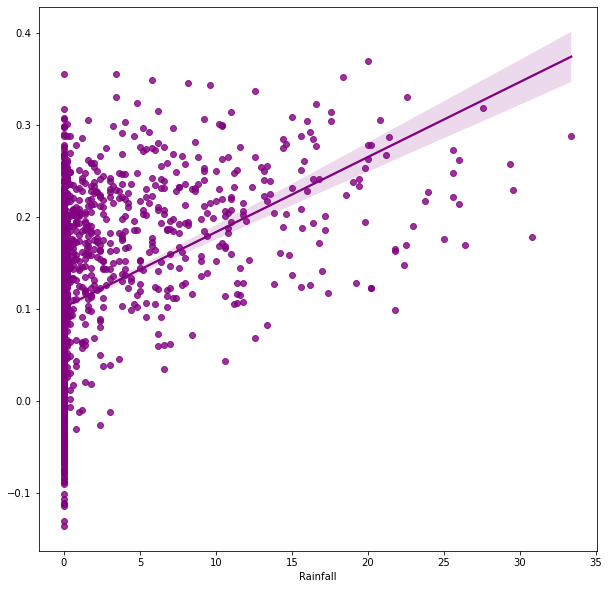

SVR()
Mean absolute error 1.822956697229907
Mean squared error 22.63685114071052
Root Mean squared error 4.75781999877155
R2 Score -0.12815959969737456
At random state SVR(),the training accuracy is :- -0.10808920489326734
At random state SVR(),the testing accuracy is :- -0.12815959969737456
Cross Validation Score: -0.11317473914460781
Difference Between r2_score and CrossValidation Score: 0.014984860552766752
---------------------------------------------------------------------------------------------------------


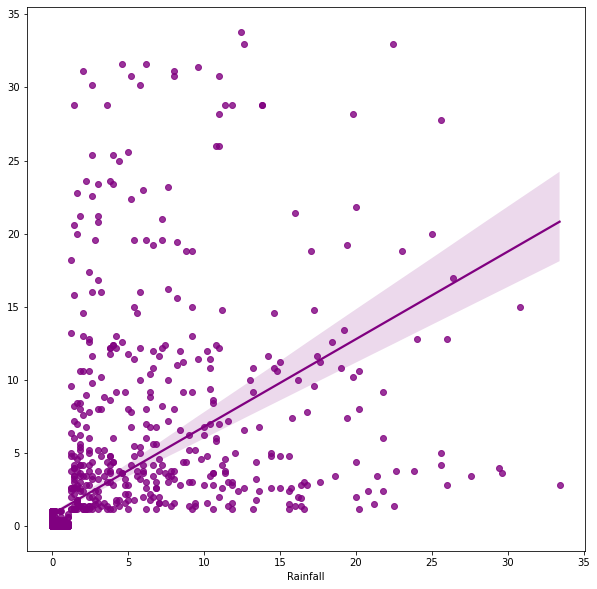

DecisionTreeRegressor()
Mean absolute error 1.6590380549682875
Mean squared error 21.432901691331924
Root Mean squared error 4.629568197071075
R2 Score -0.068158006700894
At random state DecisionTreeRegressor(),the training accuracy is :- 1.0
At random state DecisionTreeRegressor(),the testing accuracy is :- -0.068158006700894
Cross Validation Score: 0.0024675641808869163
Difference Between r2_score and CrossValidation Score: 0.07062557088178092
---------------------------------------------------------------------------------------------------------


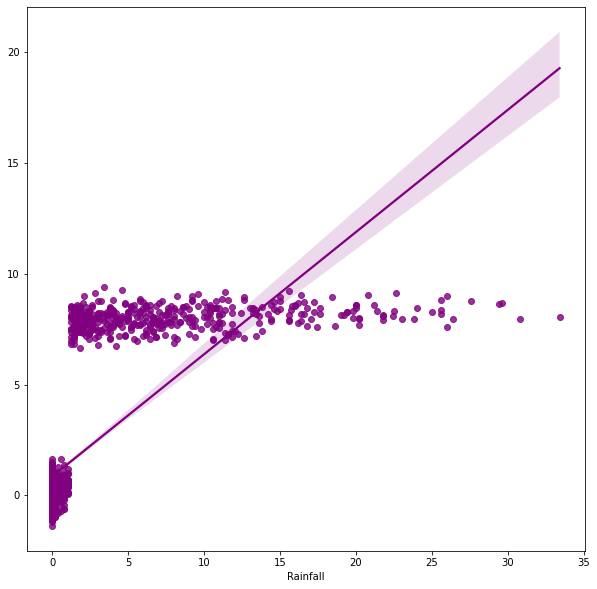

LinearRegression()
Mean absolute error 1.4467117485038927
Mean squared error 9.249977344638717
Root Mean squared error 3.0413775406283774
R2 Score 0.5390060802418718
At random state LinearRegression(),the training accuracy is :- 0.4926584644221391
At random state LinearRegression(),the testing accuracy is :- 0.5390060802418718
Cross Validation Score: 0.4965476697126469
Difference Between r2_score and CrossValidation Score: 0.04245841052922489
---------------------------------------------------------------------------------------------------------


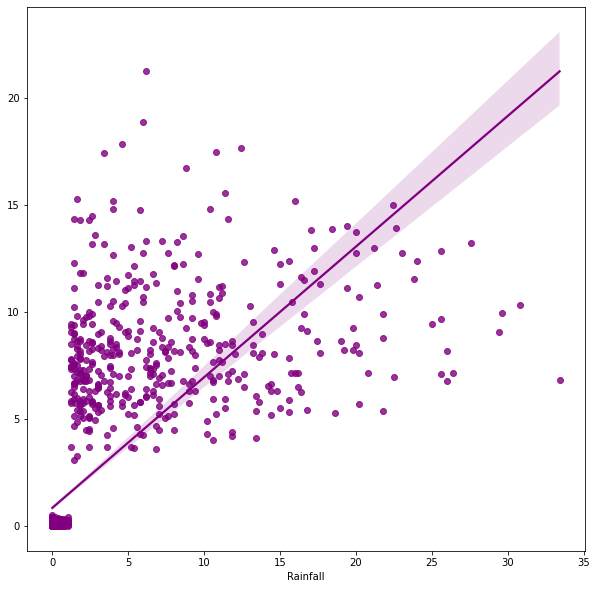

RandomForestRegressor()
Mean absolute error 1.2434651162790697
Mean squared error 9.715253082452433
Root Mean squared error 3.1169300733979313
R2 Score 0.5158179925145632
At random state RandomForestRegressor(),the training accuracy is :- 0.9306491758704577
At random state RandomForestRegressor(),the testing accuracy is :- 0.5158179925145632
Cross Validation Score: 0.5030916339451137
Difference Between r2_score and CrossValidation Score: 0.01272635856944948
---------------------------------------------------------------------------------------------------------


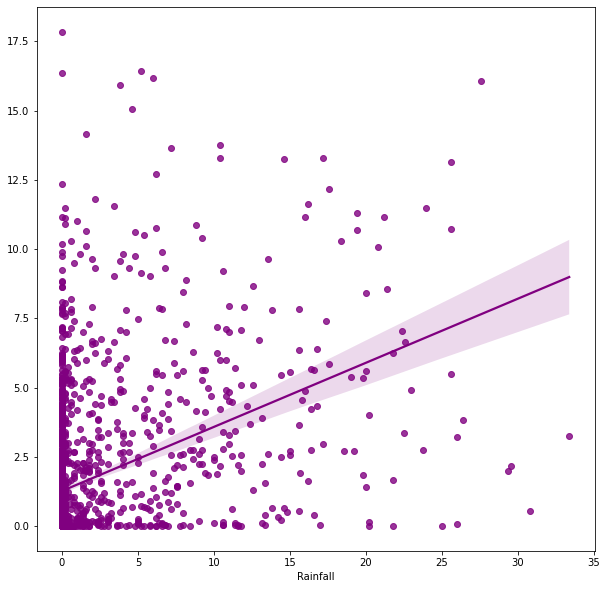

KNeighborsRegressor()
Mean absolute error 2.13600422832981
Mean squared error 17.955449894291753
Root Mean squared error 4.237387154166085
R2 Score 0.10514881070624726
At random state KNeighborsRegressor(),the training accuracy is :- 0.4082346718176154
At random state KNeighborsRegressor(),the testing accuracy is :- 0.10514881070624726
Cross Validation Score: 0.06047736076559107
Difference Between r2_score and CrossValidation Score: 0.044671449940656194
---------------------------------------------------------------------------------------------------------


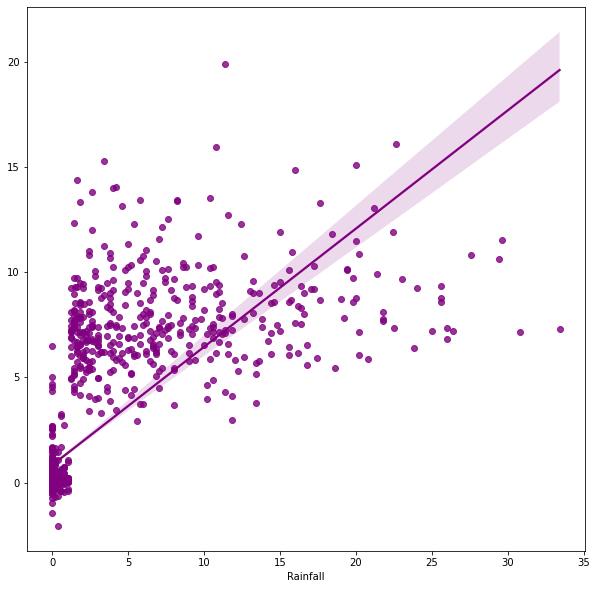

GradientBoostingRegressor()
Mean absolute error 1.2615744602368593
Mean squared error 9.312109929120439
Root Mean squared error 3.051574991560987
R2 Score 0.5359095598291452
At random state GradientBoostingRegressor(),the training accuracy is :- 0.6566246180447388
At random state GradientBoostingRegressor(),the testing accuracy is :- 0.5359095598291452
Cross Validation Score: 0.5041974256166564
Difference Between r2_score and CrossValidation Score: 0.03171213421248886
---------------------------------------------------------------------------------------------------------


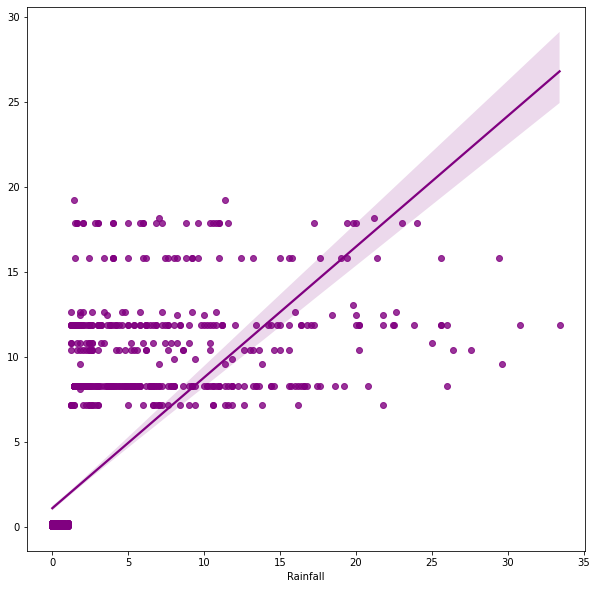

AdaBoostRegressor()
Mean absolute error 1.4612943275605879
Mean squared error 11.949641289853597
Root Mean squared error 3.4568253195458976
R2 Score 0.4044621113471124
At random state AdaBoostRegressor(),the training accuracy is :- 0.447140046732419
At random state AdaBoostRegressor(),the testing accuracy is :- 0.4044621113471124
Cross Validation Score: 0.4009965399906642
Difference Between r2_score and CrossValidation Score: 0.003465571356448205
---------------------------------------------------------------------------------------------------------


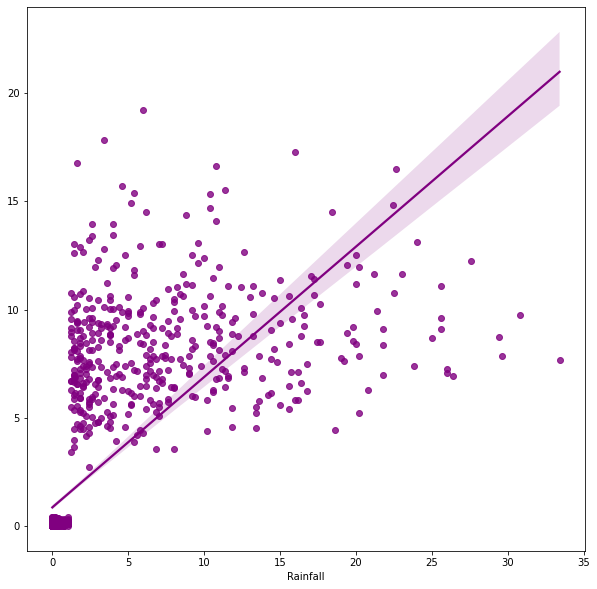

ExtraTreesRegressor()
Mean absolute error 1.2394059196617337
Mean squared error 9.751552214587738
Root Mean squared error 3.122747542563718
R2 Score 0.5140089416830418
At random state ExtraTreesRegressor(),the training accuracy is :- 1.0
At random state ExtraTreesRegressor(),the testing accuracy is :- 0.5140089416830418
Cross Validation Score: 0.5038832112514449
Difference Between r2_score and CrossValidation Score: 0.010125730431596924
---------------------------------------------------------------------------------------------------------


In [1564]:
for i in models:
    create_model(i)

In [1565]:
params = {'n_estimators': [13,15,17],
         'max_depth':[5,6],
         'min_samples_split':[5,6],
         'min_samples_leaf':[3,5,6]
         }

In [1566]:
from sklearn.model_selection import RandomizedSearchCV
RSCV = RandomizedSearchCV(RandomForestRegressor(),params, cv=5)

In [1567]:
RSCV.fit(x_train, y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(),
                   param_distributions={'max_depth': [5, 6],
                                        'min_samples_leaf': [3, 5, 6],
                                        'min_samples_split': [5, 6],
                                        'n_estimators': [13, 15, 17]})

In [1568]:
RSCV.best_params_

{'n_estimators': 15,
 'min_samples_split': 5,
 'min_samples_leaf': 5,
 'max_depth': 5}

In [1569]:
Final_Model = RandomForestRegressor(n_estimators=17,min_samples_split=6,min_samples_leaf=3,max_depth=5)
Classifier = Final_Model.fit(x_train, y_train)
lr_pred = Final_Model.predict(x_test)
lr_r2_score = r2_score(y_test, lr_pred, multioutput='variance_weighted')
print(f"R2 score for the Final Model is:", lr_r2_score*100)

R2 score for the Final Model is: 55.11068793021167


In [1570]:
Final_Model

RandomForestRegressor(max_depth=5, min_samples_leaf=3, min_samples_split=6,
                      n_estimators=17)

In [1571]:
from sklearn.model_selection import GridSearchCV

In [1572]:
params = {'n_estimators': [13,15,17],
         'max_depth':[5,6],
         'min_samples_split':[5,6],
         'min_samples_leaf':[3,5,6]
         }

In [1573]:
GSCV=GridSearchCV(RandomForestRegressor(),params, cv=5)


In [1574]:
GSCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [5, 6], 'min_samples_leaf': [3, 5, 6],
                         'min_samples_split': [5, 6],
                         'n_estimators': [13, 15, 17]})

In [1575]:
GSCV.best_params_

{'max_depth': 5,
 'min_samples_leaf': 6,
 'min_samples_split': 5,
 'n_estimators': 17}

In [1576]:
Last_Model = RandomForestRegressor(n_estimators=17,min_samples_split=6,min_samples_leaf=3,max_depth=6)
Classifier = Last_Model.fit(x_train, y_train)
lr_pred = Last_Model.predict(x_test)
lr_r2_score = r2_score(y_test, lr_pred, multioutput='variance_weighted')
print(f"R2 score for the Last_Model is:", lr_r2_score*100)

R2 score for the Last_Model is: 55.01131469370393


In [1577]:
Last_Model

RandomForestRegressor(max_depth=6, min_samples_leaf=3, min_samples_split=6,
                      n_estimators=17)

In [1578]:
# to improve accuracy of model
from sklearn.linear_model import Lasso,Ridge,ElasticNet

In [1579]:
lasso= Lasso(alpha=0.0001)

In [1580]:

lasso.fit(x_train,y_train)


Lasso(alpha=0.0001)

In [1581]:

lasso.score(x_train,y_train)


0.4926584537514229

In [1582]:

lasso_pred=lasso.predict(x_test)


In [1583]:
r2_score(y_test,lasso_pred)

0.5390079767145606

In [1584]:

ridge=Ridge(alpha=0.1)


In [1585]:

ridge.fit(x_train,y_train)


Ridge(alpha=0.1)

In [1586]:

ridge.score(x_train,y_train)*100


49.265845364468085

In [1587]:

ridge_pred=ridge.predict(x_test)


In [1588]:

r2_score(y_test,ridge_pred)

0.5390133681880287

In [1589]:
#saving the model
import joblib
joblib.dump(Last_Model,'Rainfallpred1.pkl')

['Rainfallpred1.pkl']

In [1590]:
#Loading the saved model
RF1=joblib.load('Rainfallpred1.pkl')

In [1591]:
prediction = RF1.predict(x_test)
prediction

array([0.01282167, 0.00921896, 0.02894166, ..., 0.02962827, 0.04215516,
       0.04327041])

In [1592]:
pd.DataFrame([RF1.predict(x_test)[:],y_test[:]],index=["Predicted","Original"])

,0,1,2,3,4,5,6,7,8,9,...,1882,1883,1884,1885,1886,1887,1888,1889,1890,1891
Predicted,0.012822,0.009219,0.028942,0.020149,0.050921,0.035818,0.010881,0.030662,9.699054,0.04144,...,6.947285,0.023937,11.735088,10.769615,0.134113,0.209106,0.135591,0.029628,0.042155,0.04327
Original,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.600000,0.00000,...,30.800000,0.000000,10.800000,17.200000,0.800000,0.000000,0.200000,0.000000,0.200000,0.00000


<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

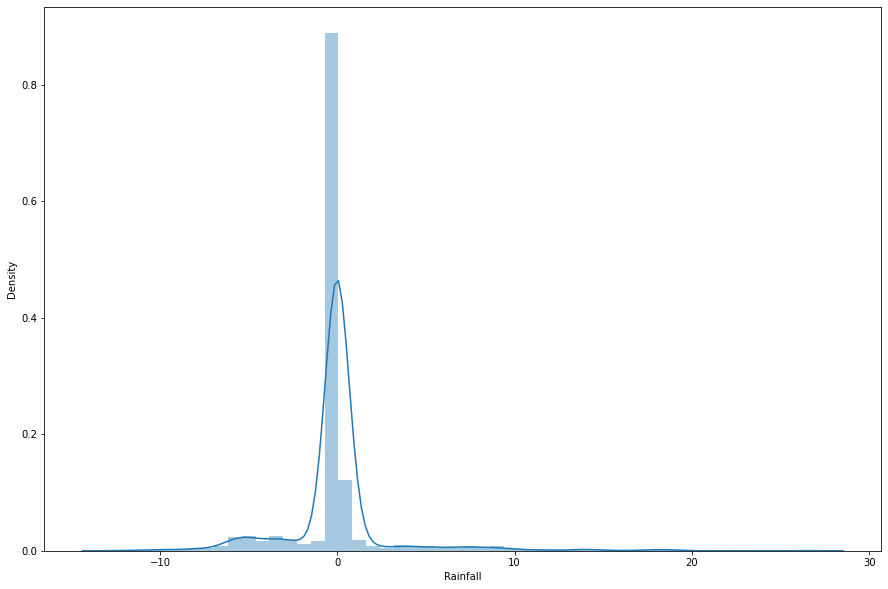

In [1593]:
plt.figure(figsize=(15,10))
sns.distplot(y_test-prediction)

In [1594]:
import pickle
filename = 'Rainfallpred1.pkl'
pickle.dump(Last_Model,open(filename, 'wb'))

In [1595]:
loaded_model = pickle.load(open(filename, 'rb'))
predicted = loaded_model.score(x_test,y_test)*100
print(predicted)

55.01131469370393


<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

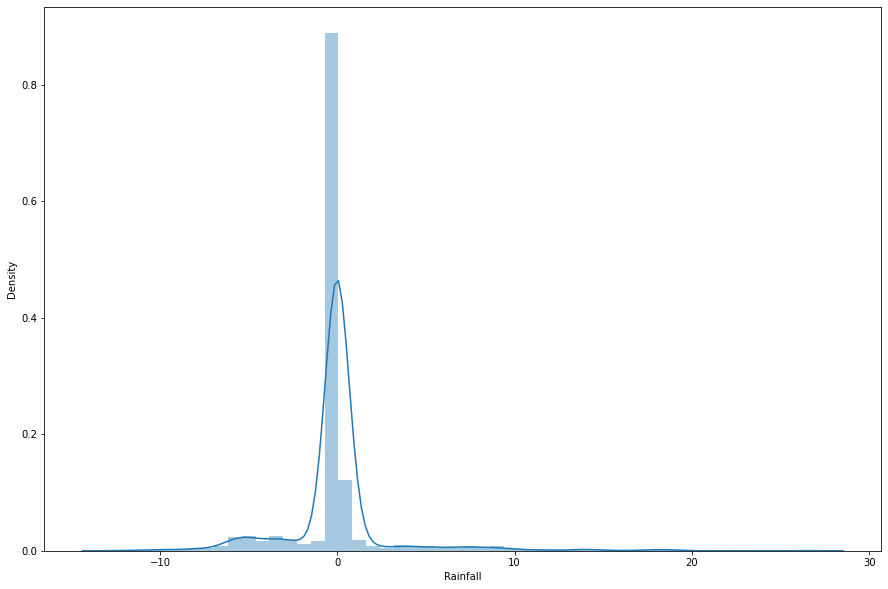

In [1596]:
plt.figure(figsize=(15,10))
sns.distplot(y_test-prediction)